In [2]:
%matplotlib inline

# Bike Sharing Statistics Project

**Dataset downloaded from**: http://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset


**Prompt**: 
I'd like you to build simple regression models that explains what are the most important factors determining the number of riders? Number of casual riders? Number of registered riders? Come up with some hypotheses about what additional attributes may play a role in determining ridership. For example, are there some interactions between variables that you may be able to explore? For example, temperature may have a linear positive effect on ridership during the winter and spring months, but could it even have negative impact during the summer months? I'd like you to not only build models that describe the interactions between variables here contributing to ridership, but also visualize these variables and their relationship to ridership using common seaborn plots, like scatterplots. As you continue through your statistics courses, keep in mind how what you're learning could be applied to the dataset in question.

Start off using simple linear regression techniques, like ordinary least squares, before delving into more complex models with cross validation etc.

## Table of Contents


    1. Downloading and accessing the dataset
    2. Regressing cnt onto the conditions observed in the days dataframe
        a. Is there a relationship between the conditions and cnt?
        b. Which subset of conditions is most effective in predicting cnt?
        c. How accurate is the model?
        d. Making some predictions
        e. Visualizing the model
        f. Using cross validation
        g. Can cnt be more accurately predicted with different non-linear models?
        h. Visualizing non-linear models
        i. Conclusions for Section 2
    3. Regressing cnt onto the conditions observed in the hours dataframe*
    4. Regressing casual onto the conditions observed in the days dataframe* 
    5. Regressing casual onto the conditions observed in the hours dataframe* 
    6. Regressing registered onto the conditions observed in the days dataframe* 
    7. Regressing registered onto the conditions observed in the hours dataframe*
    8. Testing and answering additional questions/hypotheses
        a. What are the interactions between the season and temp features?
        b. Have the bike sharing programs been getting more or less popular?
        c. Registered riders are more likely to use bikes in bad weather?
        d. On what realistic set of conditions could the bike sharing companies expect the most users?
    9. Reflection

*: (subsections are similar to in Section 2)


## Citations
1. sklearn documentation
2. statsmodels.api documentation
3. matplotlib documentation
4. some ideas came from "An Introduction to Statistical Learning with Applications in R" (Springer Texts in Statistics)

Most of the code is my work but I took a few lines from the above sources

## Downloading and accessing the dataset


In [3]:
import pandas as pd
day = pd.read_csv('C:\\Users\\prana\\Desktop\\Statistics and Machine Learning\\day.csv')
hour = pd.read_csv('C:\\Users\\prana\\Desktop\\Statistics and Machine Learning\\hour.csv')


Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv
	
	- instant: record index
	- dteday : date
	- season : season (1:springer, 2:summer, 3:fall, 4:winter)
	- yr : year (0: 2011, 1:2012)
	- mnth : month ( 1 to 12)
	- hr : hour (0 to 23)
	- holiday : whether day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
	- weekday : day of the week
	- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
	+ weathersit : 
		- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
		- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
		- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
		- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
	- temp : Normalized temperature in Celsius. The values are divided to 41 (max)
	- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
	- hum: Normalized humidity. The values are divided to 100 (max)
	- windspeed: Normalized wind speed. The values are divided to 67 (max)
	- casual: count of casual users
	- registered: count of registered users
	- cnt: count of total rental bikes including both casual and registered

In [4]:
display(day.head(), day.describe())
display(hour.head(), hour.describe())

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,2.496580,0.500684,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,1.110807,0.500342,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,3.000000,1.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,731.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.840896,0.972500,0.507463,3410.000000,6946.000000,8714.000000


,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


## Regressing cnt onto the conditions observed in the day dataframe

In [5]:
import sklearn
import numpy as np
from sklearn import datasets, linear_model
import statsmodels.api as sm
from scipy import stats
from sklearn.linear_model import LinearRegression

day_conditions = ['season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

#using statsmodels.api here since I don't think sklearn can give info about F-statistics or p-values
cnt_day_model = sm.OLS(day['cnt'], sm.add_constant(day[day_conditions])).fit()

<span style="color:blue">
**Is at least one of the conditions a good predictor of cnt?**
</span>


<span style="color:blue">
$H_0:$ all conditions' coefficients in the regression model are approximately 0; no conditions affect cnt
</span>


<span style="color:blue">
$H_a:$ at least one condition's coefficient in the model is non-zero; at least one condition affects cnt
</span>

In [6]:
print(cnt_day_model.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     261.9
Date:                Sat, 24 Nov 2018   Prob (F-statistic):          7.80e-243
Time:                        21:15:25   Log-Likelihood:                -5981.0
No. Observations:                 731   AIC:                         1.199e+04
Df Residuals:                     719   BIC:                         1.204e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1469.0031    240.218      6.115      0.0

<span style="color:blue">
Based on the probability of getting the above F-statistic in the ordinary least squares model, we can reject $H_0$.
</span>

<span style="color:blue">
Now the question is: **Are all conditions necessary in predicting cnt, or just a select few?** Backwards selection can be used to answer this question.
</span>

In [7]:
updated_day_conditions = ['const', 'season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

def p_threshold():
    for x in cnt_day_model.pvalues:
        if x >= (10**-6): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(cnt_day_model.rsquared))
    max_p = max(cnt_day_model.pvalues)
    del updated_day_conditions[np.where(cnt_day_model.pvalues == max_p)[0][0]]
    cnt_day_model = sm.OLS(day['cnt'], sm.add_constant(day[updated_day_conditions[1:]])).fit()
    
print('\n\n', cnt_day_model.pvalues)
print('\n\n', updated_day_conditions)

R^2 coeff: 0.8002441102343252
R^2 coeff: 0.7996636553054942
R^2 coeff: 0.7988674509988137
R^2 coeff: 0.7974015264495957
R^2 coeff: 0.7946256515548494
R^2 coeff: 0.7909062938844811
R^2 coeff: 0.7850140237084976
R^2 coeff: 0.7340898520982112


 const          9.896789e-13
yr            1.169086e-113
weathersit     2.972348e-23
atemp         2.758371e-128
dtype: float64


 ['season', 'yr', 'weathersit', 'atemp']


<span style="color:blue">
So, the conditions being taken into account can be reduced to the 4 listed above. Now, **how well does the model fit the data?**
</span>

In [8]:
print(cnt_day_model.rsquared)

0.7275275249757884


<span style="color:blue">
The $R^2$ value above is not that far away from $1$, so the model is not that inaccurate. As seen 3 cells above, the $R^2$ value didn't decrease significantly each time a condition was removed from the conditions list. Since the $R^2$ is calculated based off the training data each condition inevitably increases the $R^2$ by a little bit anyway, so we can be confident that we didn't decrease the accuracy of the model by removing the conditions with the greatest $p$-values.
</span>

<span style="color:blue">
**Predicting some values:**
</span>

In [9]:
print("Expected range of each condition:")
params = ['const','season', 'yr', 'atemp', 'weathersit']
for x in range(0,4):
    print(params[x], ' \n', cnt_day_model.conf_int(alpha=0.05, cols=None).iloc[x]/cnt_day_model.params[x], '\n\n')

display(day[['season', 'yr', 'atemp', 'weathersit', 'cnt']].describe())

Expected range of each condition:
const  
 0    0.729623
1    1.270377
Name: const, dtype: float64 


season  
 0    0.928155
1    1.071845
Name: yr, dtype: float64 


yr  
 0    1.190898
1    0.809102
Name: weathersit, dtype: float64 


atemp  
 0    0.934178
1    1.065822
Name: atemp, dtype: float64 




,season,yr,atemp,weathersit,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000
mean,2.496580,0.500684,0.474354,1.395349,4504.348837
std,1.110807,0.500342,0.162961,0.544894,1937.211452
min,1.000000,0.000000,0.079070,1.000000,22.000000
25%,2.000000,0.000000,0.337842,1.000000,3152.000000
50%,3.000000,1.000000,0.486733,1.000000,4548.000000
75%,3.000000,1.000000,0.608602,2.000000,5956.000000
max,4.000000,1.000000,0.840896,3.000000,8714.000000


In [10]:
#random prediction
#print(cnt_day_model.predict([0.8,2,2,1,0.9,1]))

#prediction based on today's conditions

print('Predicted number of bike users for today:', str(cnt_day_model.predict([3,7,0.16,1])))

Predicted number of bike users for today: [24742.53755931]


<span style="color:blue">
**Visualizing the relationships between variables**
</span>

Regression coefficient of  season  is:  [708.22584222]
Mean squared error: 3129600.59
Regression coefficient of  yr  is:  [2194.17278239]
Mean squared error: 2544058.14
Regression coefficient of  atemp  is:  [7501.83394952]
Mean squared error: 2255173.85
Regression coefficient of  weathersit  is:  [-1057.28701717]
Mean squared error: 3416206.07


 atemp  had the least mean squared error.


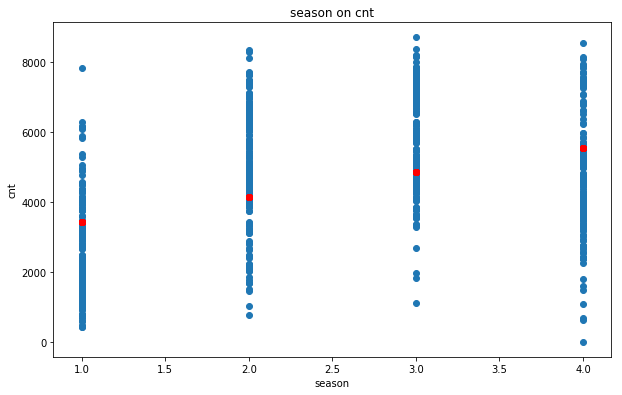

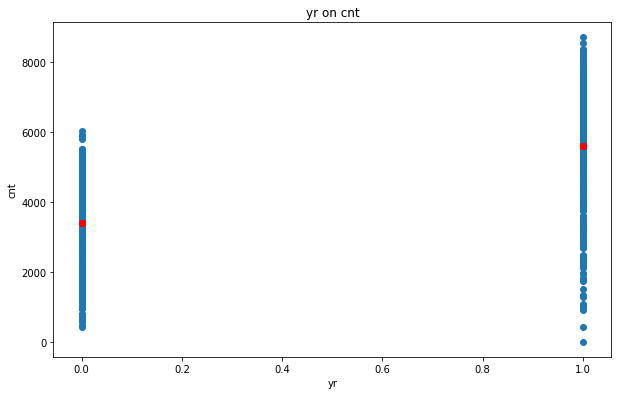

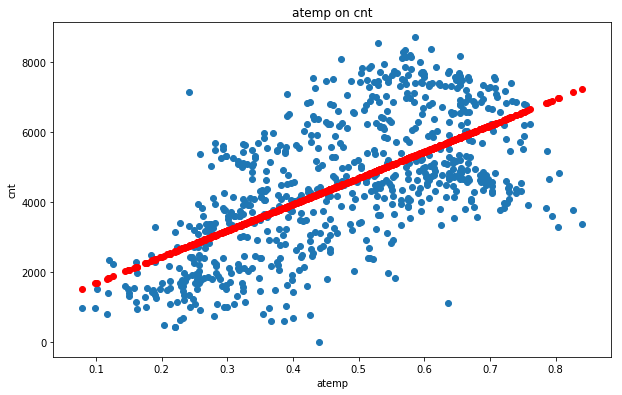

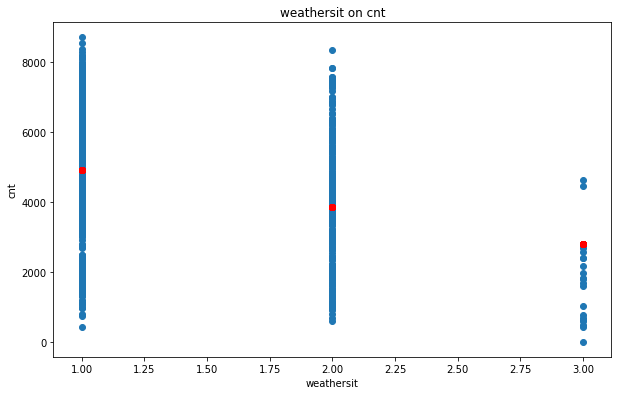

In [11]:
import matplotlib as plt
from sklearn.metrics import mean_squared_error

#looping through all individual independent variables
min_mse = [99999999,'']
ivars = ['season', 'yr', 'atemp', 'weathersit']

for ivar in ivars:
    model = LinearRegression().fit(np.array(day[ivar]).reshape(-1,1),day['cnt'])
    print("Regression coefficient of ", str(ivar), " is: ", str(model.coef_))
    plt.pyplot.figure(figsize=(10,80))
    plt.pyplot.subplot(11,1,ivars.index(ivar)+1)
    plt.pyplot.scatter(np.array(day[ivar]),np.array(day['cnt']))
    pred = model.predict(np.array(day[ivar]).reshape(-1,1))
    plt.pyplot.scatter(np.array(day[ivar]).reshape(-1,1), pred, color = 'red')
    plt.pyplot.title(ivar + ' on cnt')
    plt.pyplot.xlabel(ivar)
    plt.pyplot.ylabel('cnt')
    print("Mean squared error: %.2f" % mean_squared_error(day['cnt'], pred))
    if mean_squared_error(day['cnt'], pred) < min_mse[0]:
        min_mse[0] = mean_squared_error(day['cnt'], pred)
        min_mse[1] = ivar
        
print('\n\n', str(min_mse[1]), ' had the least mean squared error.')

[ 710.05106426 2197.08017016]
MSE: 1922816.64
[ 374.95206998 6625.50564347]
MSE: 2102305.47
[  718.45461776 -1085.42392012]
MSE: 2780405.17
[2085.95383954 7206.54565012]
MSE: 1169687.45
[2143.1559209  -961.39688637]
MSE: 2270655.22
[7178.11608287 -796.27743234]
MSE: 2069952.52


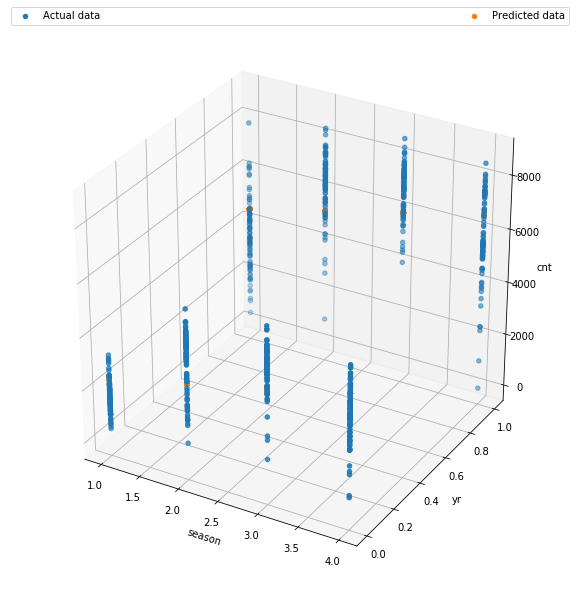

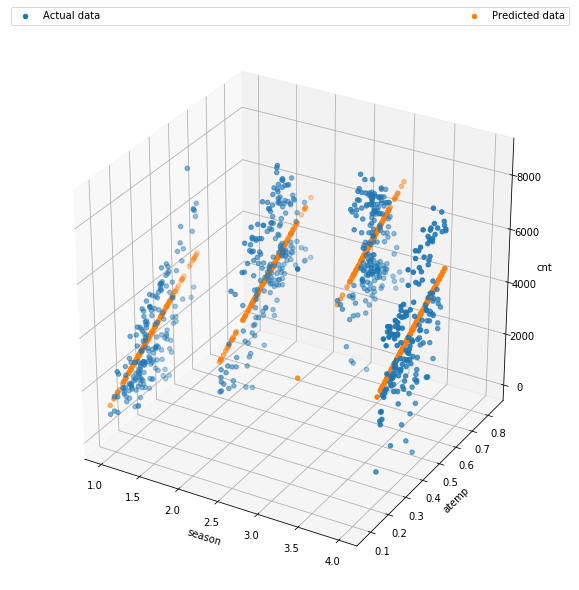

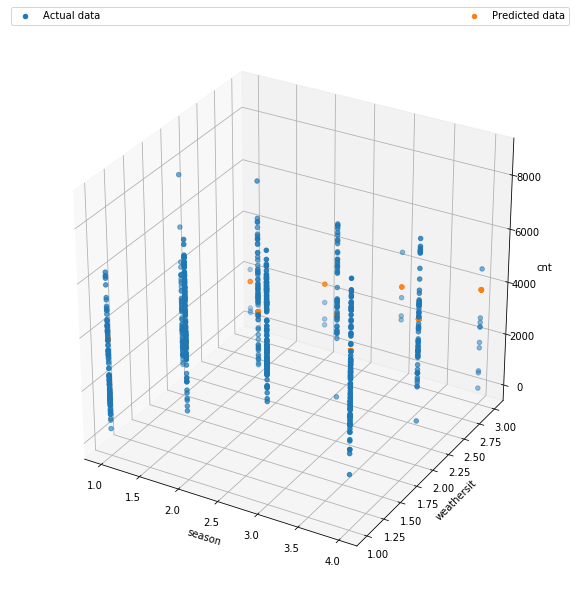

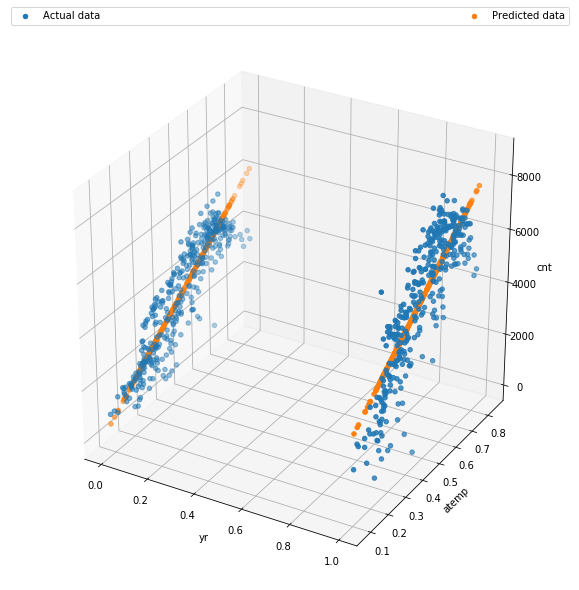

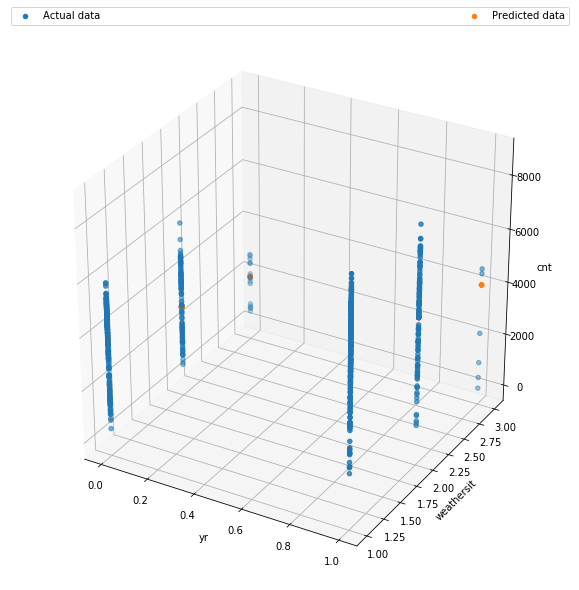

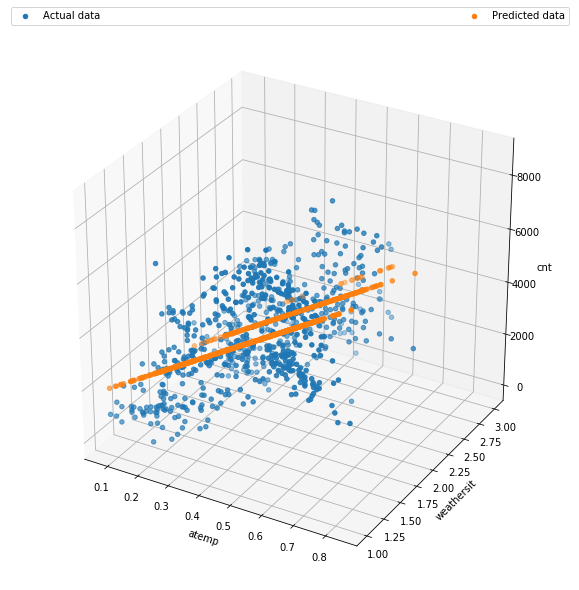

In [12]:
from mpl_toolkits.mplot3d import Axes3D

axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = LinearRegression().fit(np.array(y),day['cnt'])
    print(model.coef_)
    plot3d.scatter(day[x[0]],day[x[1]],day['cnt'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('cnt')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['cnt'], model_pred)) 

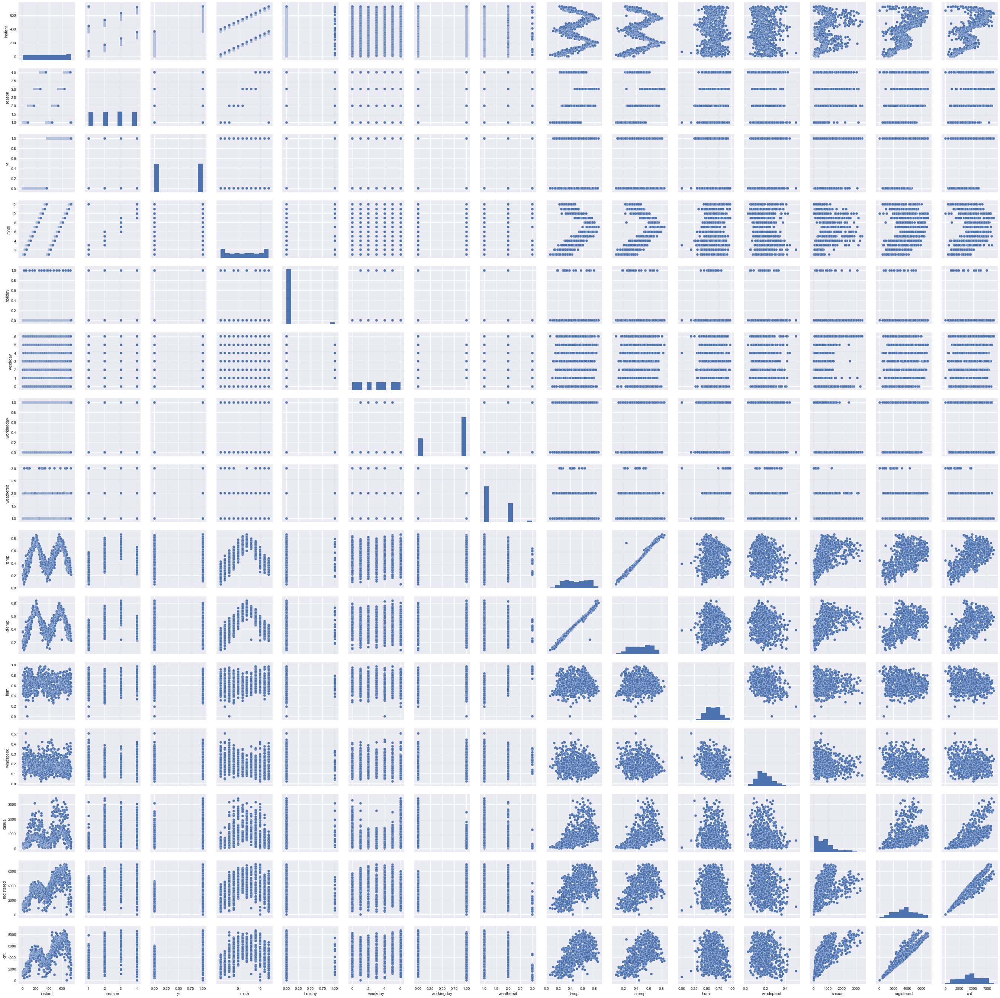

In [13]:
import seaborn as sns
sns.set()
sns.pairplot(day)

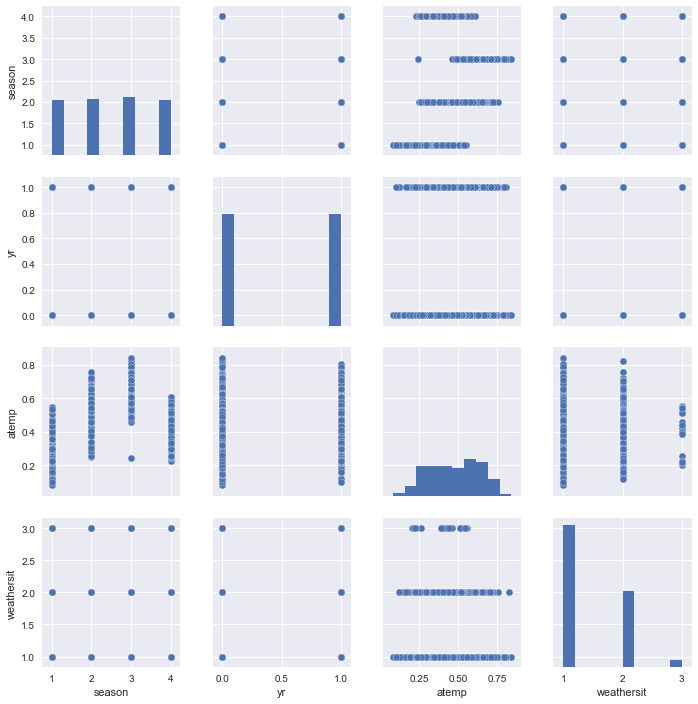

In [14]:
sns.pairplot(day[['season', 'yr', 'atemp', 'weathersit']])

<span style="color:blue">
**Checking the generalizability of the model with cross validation**
</span>

<span style="color:blue">
(using k-fold cross validation instead of leave-one-out because there is a lot of data)
</span>

In [15]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error

mae_testing = []
mae_training = []

X = np.array(day[['season', 'yr', 'atemp', 'weathersit']])
y = np.array(day['cnt'])
kf = KFold(n_splits=5)
kf.get_n_splits(X)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    model = LinearRegression().fit(np.array(X_train),y_train)
    model_pred = model.predict(np.array(X_train))
    print("Mean absolute error on training: ", str(mean_absolute_error(model_pred, y_train)), '            ')
    mae_training.append(mean_absolute_error(model_pred, y_train))
    model_pred = model.predict(np.array(X_test))
    print("Mean absolute error on testing: ", str(mean_absolute_error(model_pred, y_test)), '\n\n')
    mae_testing.append(mean_absolute_error(model_pred, y_test))


print("Average mean absolute error for training:", str(sum(mae_training)/len(mae_training)))
print("Average mean absolute error for testing:", str(sum(mae_testing)/len(mae_testing)))


Mean absolute error on training:  723.9970858255487             
Mean absolute error on testing:  570.3511116662492 


Mean absolute error on training:  674.3474607552224             
Mean absolute error on testing:  755.9376759600793 


Mean absolute error on training:  709.5019936417481             
Mean absolute error on testing:  633.420667474563 


Mean absolute error on training:  616.2598773478176             
Mean absolute error on testing:  938.6258299289744 


Mean absolute error on training:  625.1535041748876             
Mean absolute error on testing:  914.1160726483215 


Average mean absolute error for training: 669.8519843490449
Average mean absolute error for testing: 762.4902715356375


In [16]:
print(np.std(day['cnt']))

1935.8859561152221


<span style="color:blue">
The cnt values' mean deviation from their mean is greater than their mean deviation from the model (as shown by the cross-validation). This indicates that the model is generalizeable and not over-fit.
</span>

<span style="color:blue">
Now, we will try to see **if the data could be better modelled by a different kind of regression**. Based on the above plots, it only seems like polynomial or ridge regression would be accurate. The ridge regression first:
</span>


In [17]:
#LARS Lasso Ridge regression
cnt_day_model = linear_model.Lars()
cnt_day_model.fit(np.array(day[ivars]), day['cnt'])
predictions = cnt_day_model.predict(np.array(day[ivars]))
print("LARS: " + str(mean_squared_error(predictions,day['cnt'])))

#regular ridge regression from Sci-kit Learn
cnt_day_model = linear_model.Ridge(alpha = .5)
cnt_day_model.fit(np.array(day[ivars]), day['cnt'])
predictions = cnt_day_model.predict(np.array(day[ivars]))
print("Ridge: " + str(mean_squared_error(predictions,day['cnt'])))

LARS: 830641.1989992197
Ridge: 831306.1245641797


<span style="color:blue">
This means ridge regression is most likely more inaccurate than the previous models. 
</span>


In [18]:
#polynomial regression
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

features = ['season', 'yr', 'atemp', 'weathersit']

for count, degree in enumerate([1, 2, 3, 4, 5,6,7,8, 9, 10, 11, 12, 13, 14, 15]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(day[features], day['cnt'])
    predictions = model.predict(day[features])
    print("degree %d :  " % degree + str(mean_squared_error(predictions, day['cnt'])))


degree 1 :  833154.6672231662
degree 2 :  710982.8426890004
degree 3 :  573360.8479657071
degree 4 :  504300.7938283662
degree 5 :  458379.9390563466
degree 6 :  436431.4819748215
degree 7 :  419929.07078178186
degree 8 :  406377.82236153085
degree 9 :  398876.04952647845
degree 10 :  389255.61732144287
degree 11 :  384221.73713890015

C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.082706e-17
  overwrite_a=False)
C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



degree 12 :  448800.8550923361


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


degree 13 :  743148.7725658377


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


degree 14 :  499067.4316251488


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


degree 15 :  697174.58141371


<span style="color:blue">
Based on the above mean squared errors, it seems like the degree $11$ polynomial is the most accurate.
</span>

In [19]:
cnt_day_model = make_pipeline(PolynomialFeatures(11), Ridge())
cnt_day_model.fit(day[features], day['cnt'])

C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.082706e-17
  overwrite_a=False)


Pipeline(memory=None,
     steps=[('polynomialfeatures', PolynomialFeatures(degree=11, include_bias=True, interaction_only=False)), ('ridge', Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001))])

MSE: 1225554.87


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.012963e-16
  overwrite_a=True).T


MSE: 1794734.38
MSE: 2072197.65
MSE: 942052.79
MSE: 2225315.32
MSE: 1694415.52


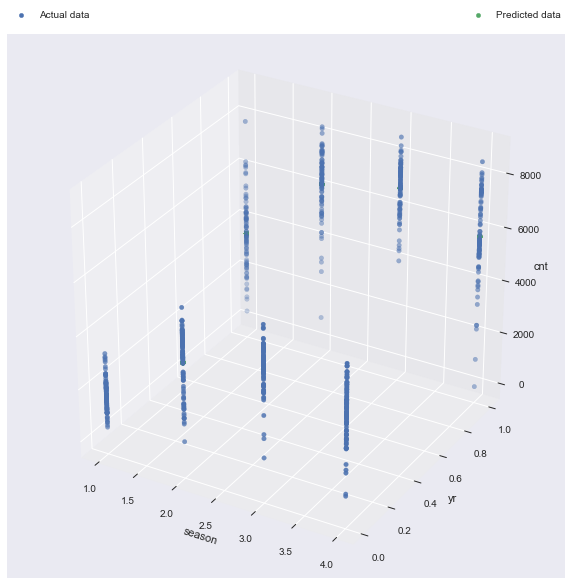

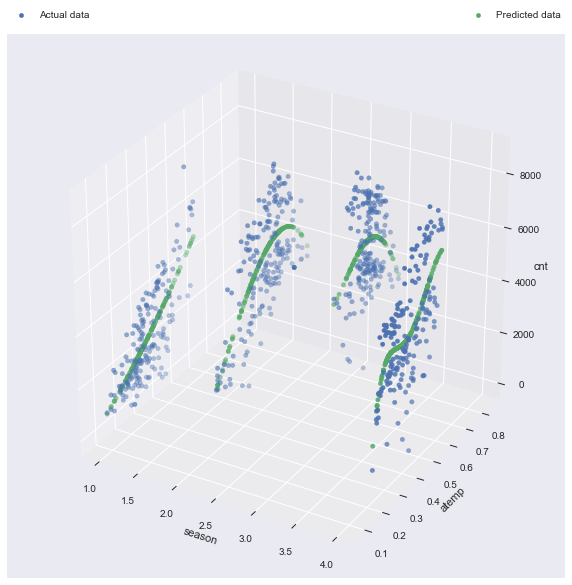

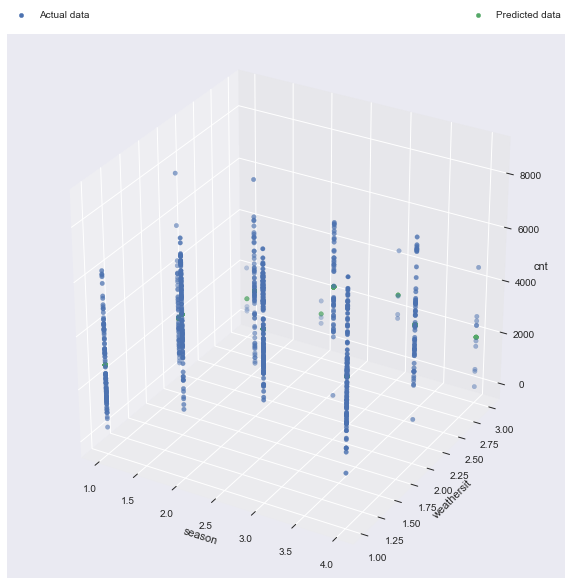

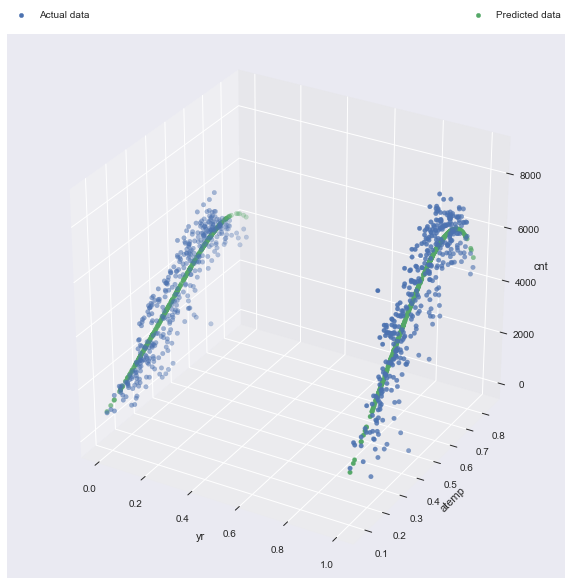

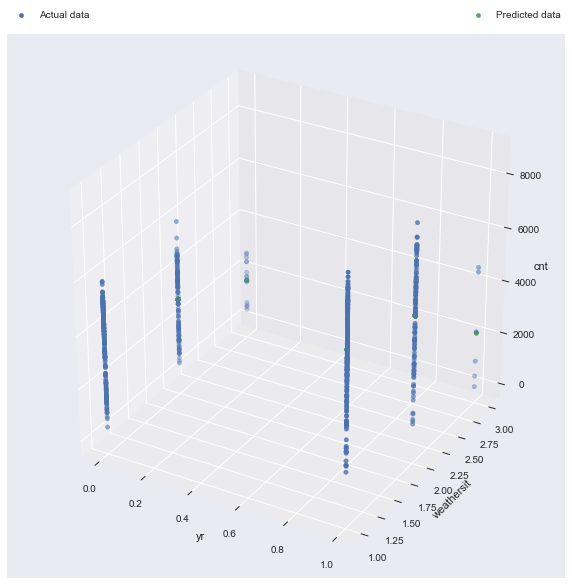

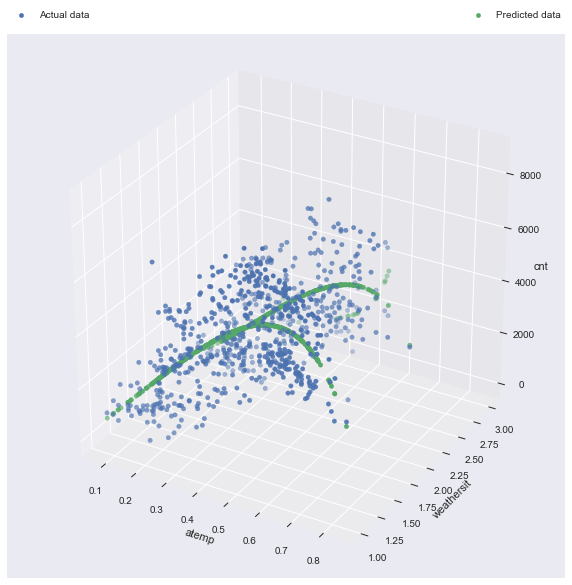

In [20]:
for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = make_pipeline(PolynomialFeatures(11), Ridge())
    model.fit(np.array(y), day['cnt'])
    plot3d.scatter(day[x[0]],day[x[1]],day['cnt'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('cnt')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['cnt'], model_pred)) 

<span style="color:blue">
Note: The above code tests and creates different $11$-th degree polynomial models for each set of axes, rather than making one for all of them. 
</span>

<span style="color:blue">
**Conclusions for Section 2**
</span>


- There does exist a correlation between the features and cnt.
- The features that most effectively predict cnt are 'season', 'yr', 'atemp', 'hum', and 'windspeed' (determined through $R^2$ and $p$ values)
- The linear model is generalizeable and not over-fit (determined through MSE)
- The 11-th degree polynomial model was the most accurate in terms of modelling the data (best out of the linear regressions, ridge regressions, and the $1$st, $2$nd, $3$rd,..., $12$th degree polynomials). (determined through MSE)

<span style="color:blue">
   It makes sense that the main factors in determining the number of bike users were the ones listed above. Season , atemp, hum, and windspeed relate to the different conditions on each day, and are probably more accurate in determining conditions on any given day than weathersit or any of the other variables. The fact that yr has a positive coefficient in this model indicates that the total count of riders has been increasing ever since the sharing programs were initiated. Of course, there is too little data to support that reasoning since data is only given from over the course of one year.

## Regressing cnt onto the conditions observed in the hours dataframe


In [21]:
hour_conditions = ['const', 'hr','season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

cnt_hour_model = sm.OLS(hour['cnt'], sm.add_constant(hour[hour_conditions[1:]])).fit()

print(cnt_hour_model.summary())
updated_hour_conditions = hour_conditions

def p_threshold():
    for x in cnt_hour_model.pvalues:
        if x >= (10**-10): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(cnt_hour_model.rsquared))
    max_p = max(cnt_hour_model.pvalues)
    del updated_hour_conditions[np.where(cnt_hour_model.pvalues == max_p)[0][0]]
    cnt_hour_model = sm.OLS(hour['cnt'], sm.add_constant(hour[updated_hour_conditions[1:]])).fit()
    
print('\n\n', cnt_hour_model.pvalues)
print('\n\n', updated_hour_conditions)

print(cnt_hour_model.rsquared)
features = updated_hour_conditions

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.389
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     920.8
Date:                Sat, 24 Nov 2018   Prob (F-statistic):               0.00
Time:                        21:16:06   Log-Likelihood:            -1.1076e+05
No. Observations:               17379   AIC:                         2.216e+05
Df Residuals:                   17366   BIC:                         2.217e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -25.7573      7.057     -3.650      0.0

<span style="color:blue">
The $p$-values are very high and the $R^2$ values are very low, which means that there isn't any good linear relationship.
</span>

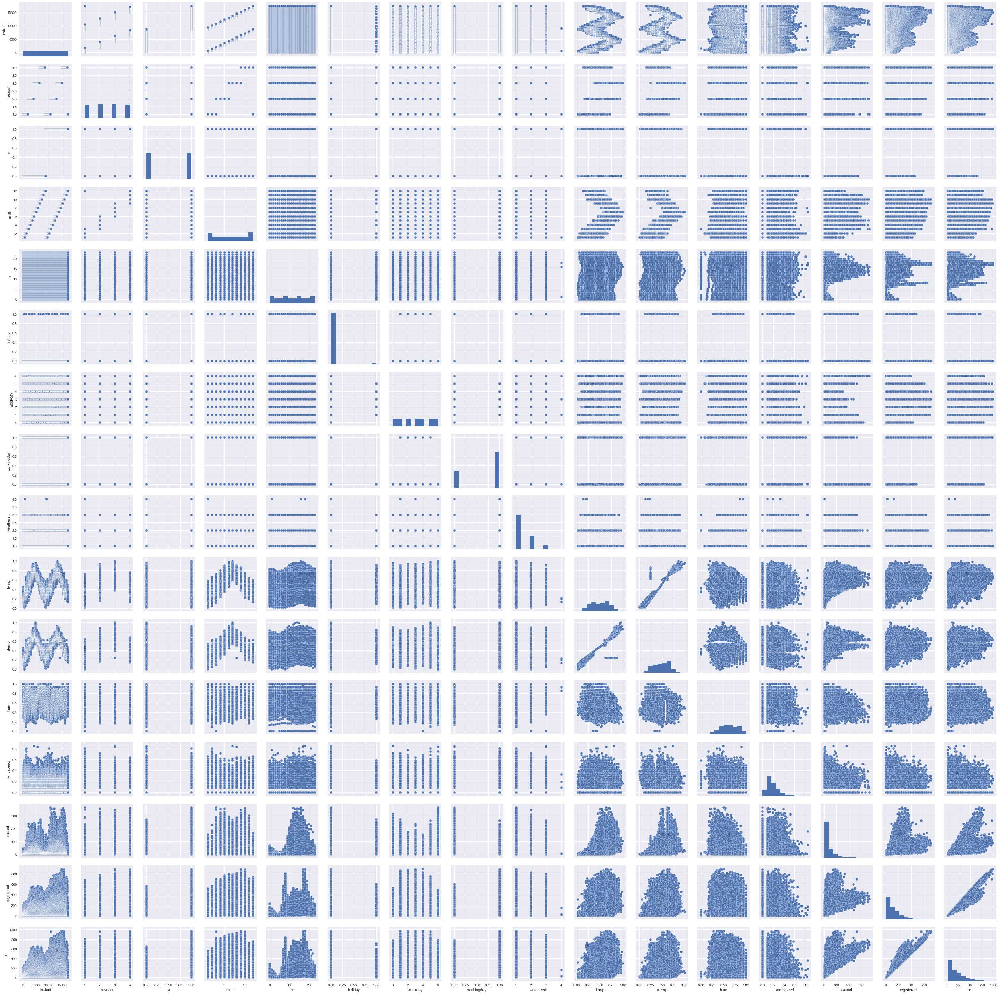

In [22]:
sns.set()
sns.pairplot(hour)

<span style="color:blue">
As seen from the above plots, the hour data is much more noisy than the day data. 
</span>

In [23]:
#Linear Regression
cnt_hour_model = LinearRegression().fit(np.array(hour[features[1:]]),hour['cnt'])
predictions = cnt_hour_model.predict(np.array(hour[features[1:]]))
print("Linear: " + str(mean_squared_error(predictions,hour['cnt'])))

#LARS Lasso Ridge regression
cnt_hour_model = linear_model.Lars()
cnt_hour_model.fit(np.array(hour[features[1:]]), hour['cnt'])
predictions = cnt_hour_model.predict(np.array(hour[features[1:]]))
print("LARS: " + str(mean_squared_error(predictions,hour['cnt'])))

#regular ridge regression from Sci-kit Learn
cnt_hour_model = linear_model.Ridge(alpha = .5)
cnt_hour_model.fit(np.array(hour[features[1:]]), hour['cnt'])
predictions = cnt_hour_model.predict(np.array(hour[features[1:]]))
print("Ridge: " + str(mean_squared_error(predictions, hour['cnt'])))

#polynomial regression
for count, degree in enumerate([1, 2, 3, 4, 5,6,7,8, 9, 10]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(hour[features[1:]], hour['cnt'])
    predictions = model.predict(hour[features[1:]])
    print("Polynomial of degree %d :  " % degree + str(mean_squared_error(predictions, hour['cnt'])))
    
print("Variance of hour['cnt']: " + str(hour['cnt'].std()**2))

Linear: 22662.725498048618
LARS: 22662.725498048618
Ridge: 22662.73081982921
Polynomial of degree 1 :  22662.746745698325
Polynomial of degree 2 :  21611.36621465822
Polynomial of degree 3 :  20992.369696802012
Polynomial of degree 4 :  20688.25099818425
Polynomial of degree 5 :  20513.21915314546
Polynomial of degree 6 :  20384.263820098688
Polynomial of degree 7 :  20277.352439173686
Polynomial of degree 8 :  20183.312851264283
Polynomial of degree 9 :  20087.02309841685


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.429831e-17
  overwrite_a=True).T


Polynomial of degree 10 :  19960.1921546424
Variance of hour['cnt']: 32901.461104311245


<span style="color:blue">
These other regressions are also really inaccurate. This can be seen in the fact that the models' mean standard error are much larger than the variance within cnt itself. 
    </span>

<span style="color:blue">
**Conclusion for Section 3**
</span>

<span style="color:blue">
The hour data is much more indecipherable than the day data. This is most likely because hours are shorter time periods than days, so therefore there is a higher probability of random chance playing a bigger role than any of the above features in determining cnt. In fact, conditions change much more drastically between days than between hours, so trying to model cnt with hours is like trying to guess sporadic changes in cnt that aren't really influenced by the data features we have. I don't think there is any way to make a generalizeable model based off this data.
</span>

## Regressing casual onto the conditions observed in the days dataframe

In [24]:
day_conditions = ['const','season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

casual_day_model = sm.OLS(day['casual'], sm.add_constant(day[day_conditions[1:]])).fit()

print(casual_day_model.summary())
updated_day_conditions = day_conditions

def p_threshold():
    for x in casual_day_model.pvalues:
        if x >= (10**-8): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(casual_day_model.rsquared))
    max_p = max(casual_day_model.pvalues)
    del updated_day_conditions[np.where(casual_day_model.pvalues == max_p)[0][0]]
    casual_day_model = sm.OLS(day['casual'], sm.add_constant(day[updated_day_conditions[1:]])).fit()
    
print('\n\n', casual_day_model.pvalues)
print('\n\n', updated_day_conditions)

print(casual_day_model.rsquared)
features = updated_day_conditions

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.684
Method:                 Least Squares   F-statistic:                     144.3
Date:                Sat, 24 Nov 2018   Prob (F-statistic):          1.18e-173
Time:                        21:17:55   Log-Likelihood:                -5385.4
No. Observations:                 731   AIC:                         1.079e+04
Df Residuals:                     719   BIC:                         1.085e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        700.7933    106.358      6.589      0.0

<span style="color:blue">
So, we can see that 'const', 'yr', 'workingday', 'weathersit', and 'temp' are the most important features here. The $F$-statistic above indicates that there is more variation between cnt in different conditions than within cnt in given conditions. The $R^2$ value is quite low so I don't know if this model will be accurate enough. 
    </span>

[ 339.65143906 -763.82902286]
MSE: 315614.93
[ 325.31331053 -297.13469415]
MSE: 415605.65
[ 306.28394378 1998.00265751]
MSE: 308444.11
[-745.01280632 -272.76070422]
MSE: 322478.76
[-809.03115377 2146.13419876]
MSE: 190761.35
[-232.50824775 1954.38475401]
MSE: 316047.51


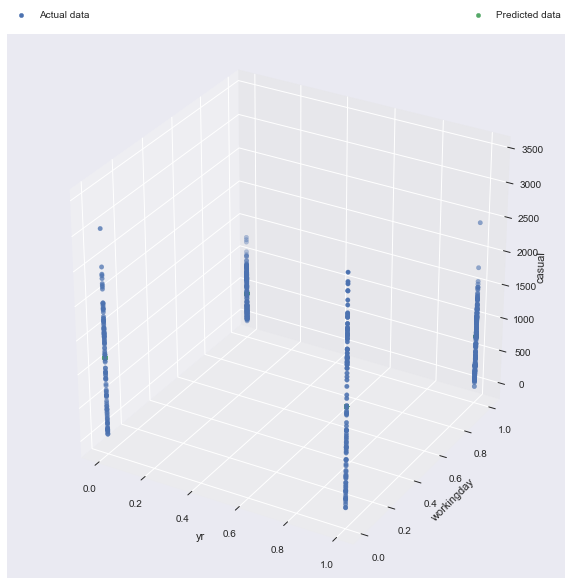

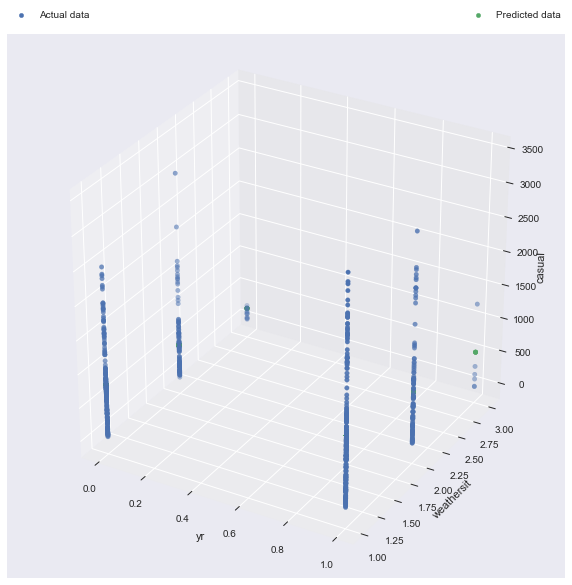

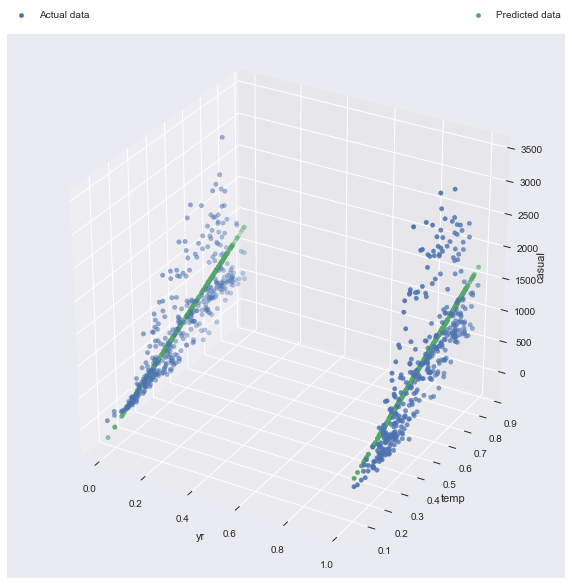

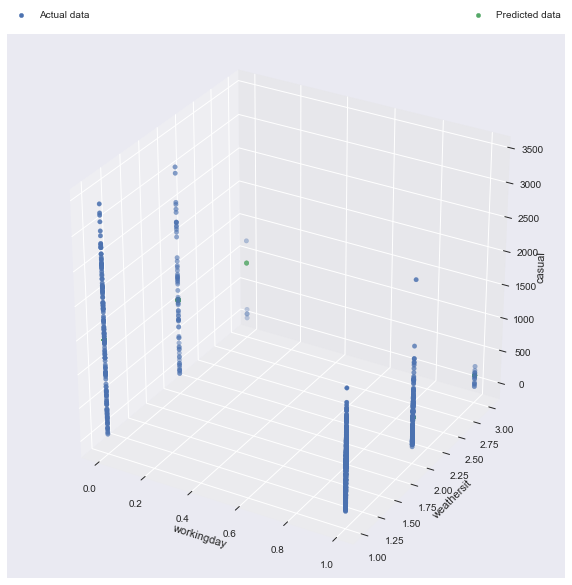

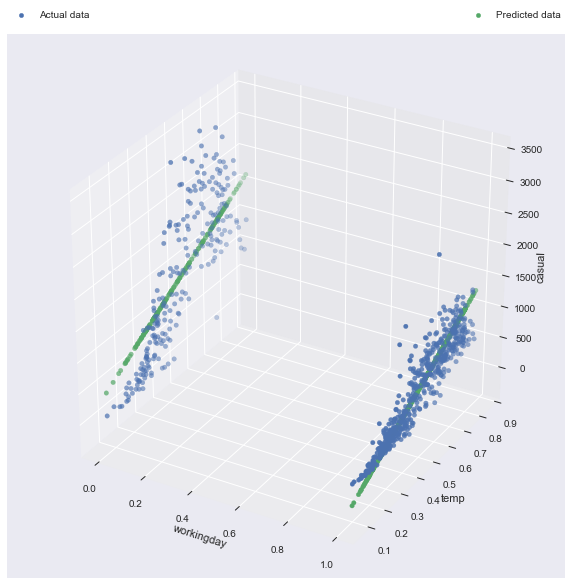

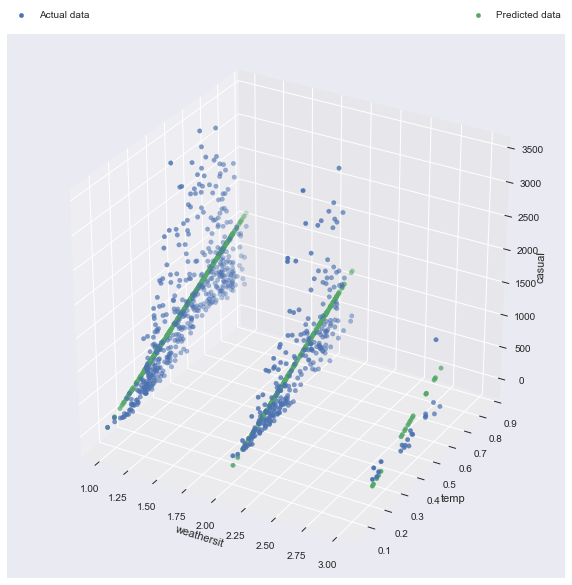

In [25]:
ivars = ['yr', 'workingday', 'weathersit', 'temp']
axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = LinearRegression().fit(np.array(y),day['casual'])
    print(model.coef_)
    plot3d.scatter(day[x[0]],day[x[1]],day['casual'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('casual')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['casual'], model_pred)) 
    

In [26]:
casual_day_model = LinearRegression().fit(np.array(day[ivars]),day['casual'])
print(mean_squared_error(day['casual'],np.array(casual_day_model.predict(day[ivars]))))
print(day['casual'].std()**2)

159065.6806858668
471450.44141821103


<span style="color:blue">
Variance in casual is higher than the MSE for our model, which is a good sign.
    </span>

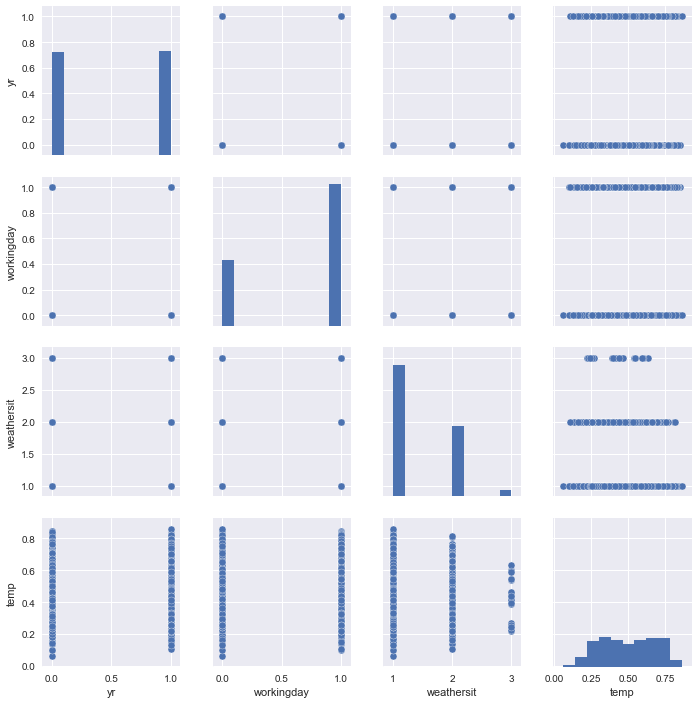

In [27]:
sns.pairplot(day[ivars])

In [28]:
mae_testing = []
mae_training = []

X = np.array(day[['yr','workingday','weathersit','temp']])
y = np.array(day['casual'])
kf = KFold(n_splits=5)
kf.get_n_splits(X)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    model = LinearRegression().fit(np.array(X_train),y_train)
    model_pred = model.predict(np.array(X_train))
    print("Mean absolute error on training: ", str(mean_absolute_error(model_pred, y_train)), '            ')
    mae_training.append(mean_absolute_error(model_pred, y_train))
    model_pred = model.predict(np.array(X_test))
    print("Mean absolute error on testing: ", str(mean_absolute_error(model_pred, y_test)), '\n\n')
    mae_testing.append(mean_absolute_error(model_pred, y_test))


print("Average mean absolute error for training: ", str(sum(mae_training)/len(mae_training)))
print("Average mean absolute error for testing: ", str(sum(mae_testing)/len(mae_testing)))
print("Standard Deviation for casual: " + str(day['casual'].std()))

Mean absolute error on training:  302.50591563719905             
Mean absolute error on testing:  292.93284112733915 


Mean absolute error on training:  293.01191912000525             
Mean absolute error on testing:  320.7094825003006 


Mean absolute error on training:  290.62543847189664             
Mean absolute error on testing:  329.3200916659563 


Mean absolute error on training:  253.24000459616192             
Mean absolute error on testing:  422.35032272259 


Mean absolute error on training:  287.8137673021524             
Mean absolute error on testing:  287.8217986040259 


Average mean absolute error for training:  285.4394090254831
Average mean absolute error for testing:  330.6269073240424
Standard Deviation for casual: 686.6224882846549


<span style="color:blue">
The fact that the model is (on average) 280-330 people off on its guesses means that it is generalizeable and not over-fit. This is because the average deviation from the mean of data points in casual is about 687 people, which is much higher.
   </span>

In [29]:
#Linear Regression
casual_day_model = LinearRegression().fit(np.array(day[ivars]),day['casual'])
predictions = casual_day_model.predict(np.array(day[ivars]))
print("Linear: " + str(mean_squared_error(predictions,day['casual'])))

#LARS Lasso Ridge regression
casual_day_model = linear_model.Lars()
casual_day_model.fit(np.array(day[ivars]), day['casual'])
predictions = casual_day_model.predict(np.array(day[ivars]))
print("LARS: " + str(mean_squared_error(predictions,day['casual'])))

#regular ridge regression from Sci-kit Learn
casual_day_model = linear_model.Ridge(alpha = .5)
casual_day_model.fit(np.array(day[ivars]), day['casual'])
predictions = casual_day_model.predict(np.array(day[ivars]))
print("Ridge: " + str(mean_squared_error(predictions, day['casual'])))

#polynomial regression
for count, degree in enumerate([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(day[ivars], day['casual'])
    predictions = model.predict(day[ivars])
    print("Polynomial of degree %d :  " % degree + str(mean_squared_error(predictions, day['casual'])))
    
print("Variance of day['casual']: " + str(day['casual'].std()**2))

Linear: 159065.6806858668
LARS: 159065.68068586683
Ridge: 159124.7470921281
Polynomial of degree 1 :  159292.74855639614
Polynomial of degree 2 :  127882.92102289155
Polynomial of degree 3 :  114837.15081868847
Polynomial of degree 4 :  106281.67108456799
Polynomial of degree 5 :  98502.3976033225
Polynomial of degree 6 :  92927.26720070209
Polynomial of degree 7 :  89149.21993551054
Polynomial of degree 8 :  87204.4957349978
Polynomial of degree 9 :  85956.94319871518
Polynomial of degree 10 :  84870.18235765804
Polynomial of degree 11 :  83879.03284308652
Polynomial of degree 12 :  82454.86688549753
Polynomial of degree 13 :  81182.0555764856
Polynomial of degree 14 :  80416.52747525704


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.068527e-17
  overwrite_a=False)


Polynomial of degree 15 :  79824.61092852941


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 16 :  972465.8035648525


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 17 :  173096.00948193925


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 18 :  318911.91231362574


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 19 :  5903855.566144402


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 20 :  365679.39390767115


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 21 :  347293.02500260726


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 22 :  346430.01317052345


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 23 :  343728.3812707448


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 24 :  344855.3242387296


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 25 :  347432.60753657715
Variance of day['casual']: 471450.44141821103


<span style="color:blue">
    The model above that best represents the data is the degree-$15$ polynomial.
    </span>

In [30]:
casual_day_model = make_pipeline(PolynomialFeatures(15), Ridge())
casual_day_model.fit(day[ivars], day['casual'])

C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.068527e-17
  overwrite_a=False)


Pipeline(memory=None,
     steps=[('polynomialfeatures', PolynomialFeatures(degree=15, include_bias=True, interaction_only=False)), ('ridge', Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001))])

C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.420327e-17
  overwrite_a=True).T


MSE: 312704.06
MSE: 414670.48
MSE: 288772.52
MSE: 319596.14
MSE: 147697.33


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.756613e-17
  overwrite_a=True).T
C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.754269e-17
  overwrite_a=True).T


MSE: 287387.79


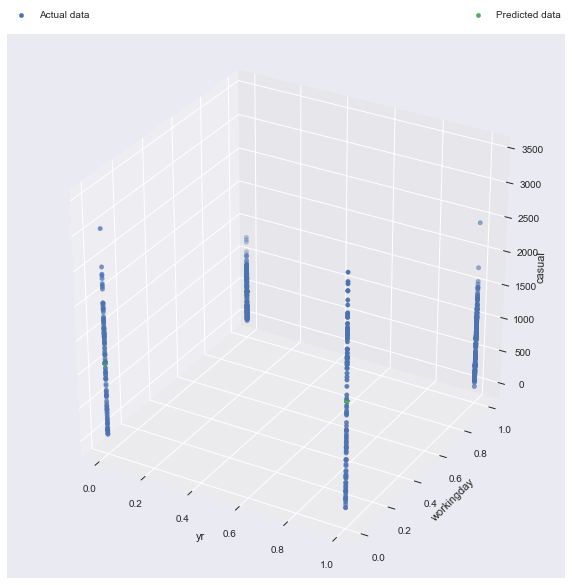

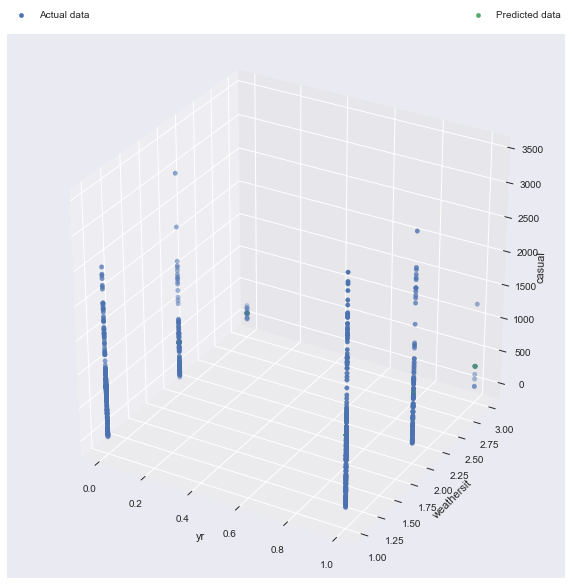

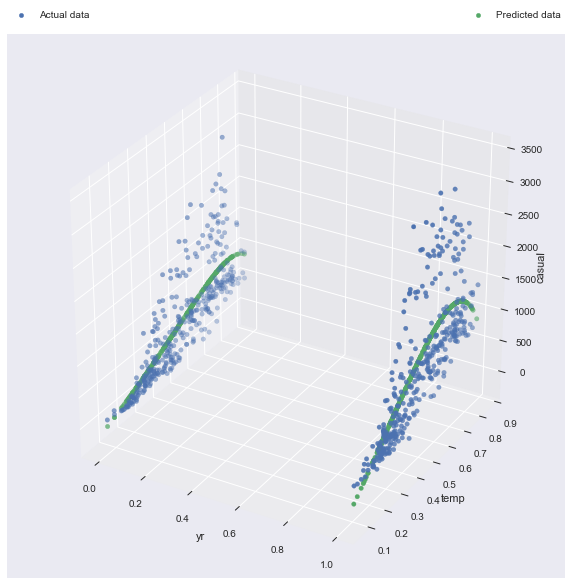

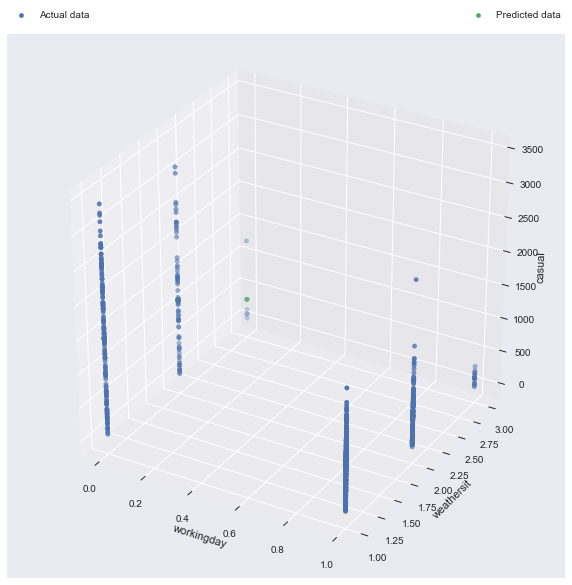

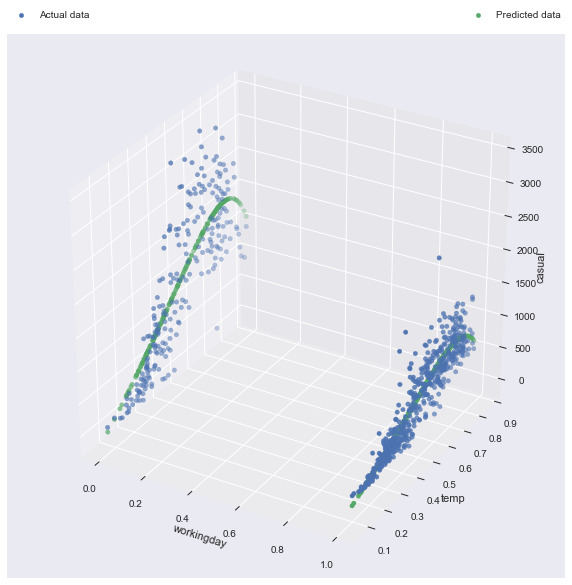

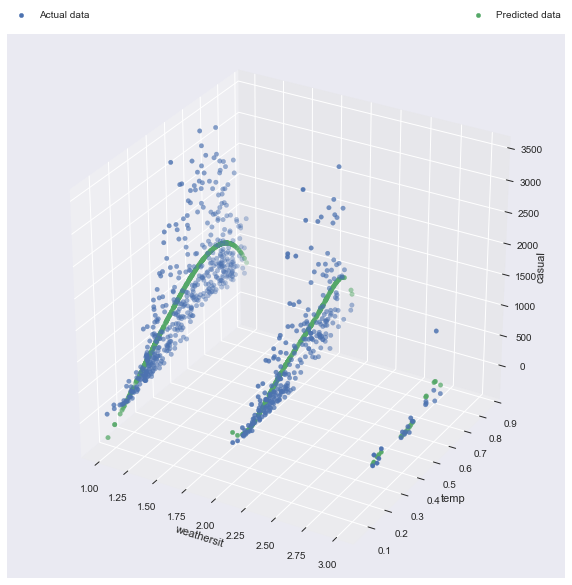

In [31]:
for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = make_pipeline(PolynomialFeatures(15), Ridge())
    model.fit(np.array(y), day['casual'])
    plot3d.scatter(day[x[0]],day[x[1]],day['casual'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('casual')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['casual'], model_pred)) 
    
#note: this just creates different models for each set of axes and graphs them - it's not the same model.
#       I'm not sure how to do this with just one model because then variables not being graphed would 
#       still have an effect on data being graphed and the diagrams wouldn't give the full picture

<span style="color:blue">
**Conclusions for Section 4**

- There does exist a correlation between the features and casual.
- The features that most effectively predict cnt are 'yr', 'workingday', 'weathersit', 'temp' (determined through $R^2$ and $p$ values)
- The linear model is generalizeable and not over-fit (determined through MSE)
- The $17$-th degree polynomial model was the most accurate in terms of modelling the data (best out of the linear regressions, ridge regressions, and the $1$st, $2$nd, $3$rd,..., $25$th degree polynomials). (determined through MSE)
    
    <span style="color:blue">
  One of the biggest differences between these results and those from Section 2 is that workingday had a relatively big influence on riders. It doesn't seem obvious why workingday would have a bigger effect on casual riders than the total sample size - if I was a casual rider, I probably wouldn't take a bike to work, so I might only ride once or twice a week regardless of holidays, etc. On the other hand, it would make sense if a registered user who rides a bike to work tends to use the sharing programs more on work days. Also, just like above, yr has a positive coefficient, indicating that the number of casual riders has been going up - however, there is only data on one year to support this claim. 

## Regressing casual onto the conditions observed in the hours dataframe

In [32]:
hour_conditions = ['const', 'hr','season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

casual_hour_model = sm.OLS(hour['casual'], sm.add_constant(hour[hour_conditions[1:]])).fit()

print(casual_hour_model.summary())
updated_hour_conditions = hour_conditions

def p_threshold():
    for x in casual_hour_model.pvalues:
        if x >= (10**-10): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(casual_hour_model.rsquared))
    max_p = max(casual_hour_model.pvalues)
    del updated_hour_conditions[np.where(casual_hour_model.pvalues == max_p)[0][0]]
    casual_hour_model = sm.OLS(hour['casual'], sm.add_constant(hour[updated_hour_conditions[1:]])).fit()
    
print('\n\n', casual_hour_model.pvalues)
print('\n\n', updated_hour_conditions)

print(casual_hour_model.rsquared)
features = updated_hour_conditions

                            OLS Regression Results                            
Dep. Variable:                 casual   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.455
Method:                 Least Squares   F-statistic:                     1212.
Date:                Sat, 24 Nov 2018   Prob (F-statistic):               0.00
Time:                        21:18:21   Log-Likelihood:                -87115.
No. Observations:               17379   AIC:                         1.743e+05
Df Residuals:                   17366   BIC:                         1.744e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.9718      1.810     10.481      0.0

<span style="color:blue">
Just like in Section 3, the $p$-values are very high and the $R^2$ values are very low, which means that there isn't any good linear relationship.

In [33]:
#Linear Regression
casual_hour_model = LinearRegression().fit(np.array(hour[features[1:]]),hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("Linear: " + str(mean_squared_error(predictions,hour['casual'])))

#LARS Lasso Ridge regression
casual_hour_model = linear_model.Lars()
casual_hour_model.fit(np.array(hour[features[1:]]), hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("LARS: " + str(mean_squared_error(predictions,hour['casual'])))

#regular ridge regression from Sci-kit Learn
casual_hour_model = linear_model.Ridge(alpha = .5)
casual_hour_model.fit(np.array(hour[features[1:]]), hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("Ridge: " + str(mean_squared_error(predictions, hour['casual'])))

#polynomial regression
for count, degree in enumerate([1, 2, 3, 4, 5,6]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(hour[features[1:]], hour['casual'])
    predictions = model.predict(hour[features[1:]])
    print("Polynomial of degree %d :  " % degree + str(mean_squared_error(predictions, hour['casual'])))
    
print("Variance of hour['casual']: " + str(hour['casual'].std()**2))

Linear: 1331.7138765361544
LARS: 1331.7138765361544
Ridge: 1331.7142617823388
Polynomial of degree 1 :  1331.7154151075254
Polynomial of degree 2 :  902.6164480924759
Polynomial of degree 3 :  644.6662999561615
Polynomial of degree 4 :  475.652975299247


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.346815e-18
  overwrite_a=True).T


Polynomial of degree 5 :  402.0510509551284


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.030224e-20
  overwrite_a=True).T


Polynomial of degree 6 :  356.60821122610275
Variance of hour['casual']: 2430.986021468238


<span style="color:blue">
Surprisingly, the high-degree polynomials seem accurate.

MSE: 2156.83
MSE: 2324.47
MSE: 1839.73
MSE: 2154.73
MSE: 1533.53
MSE: 1863.95


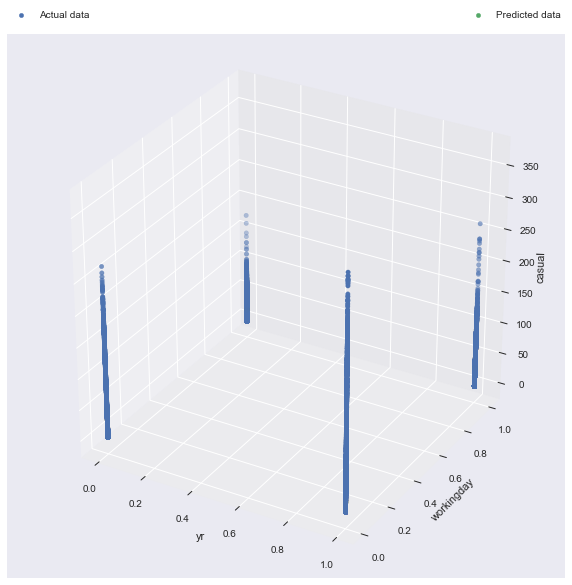

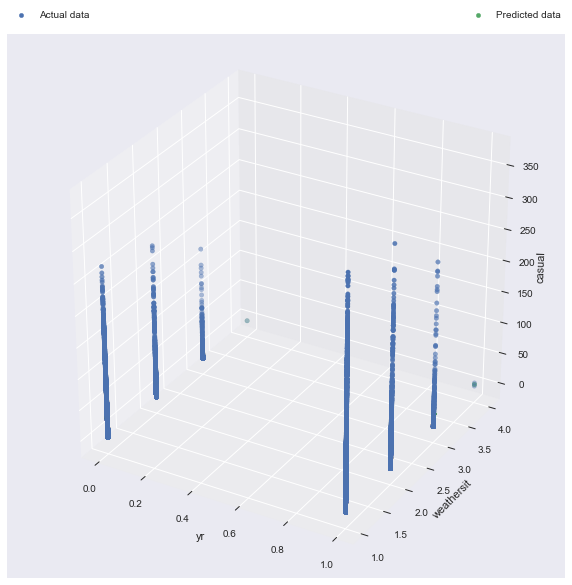

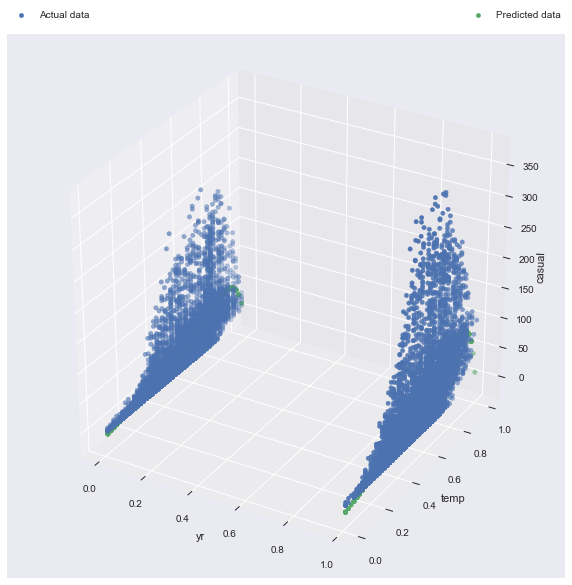

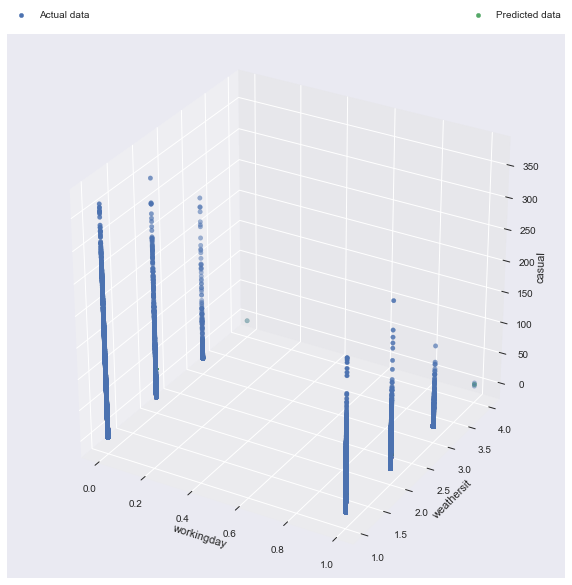

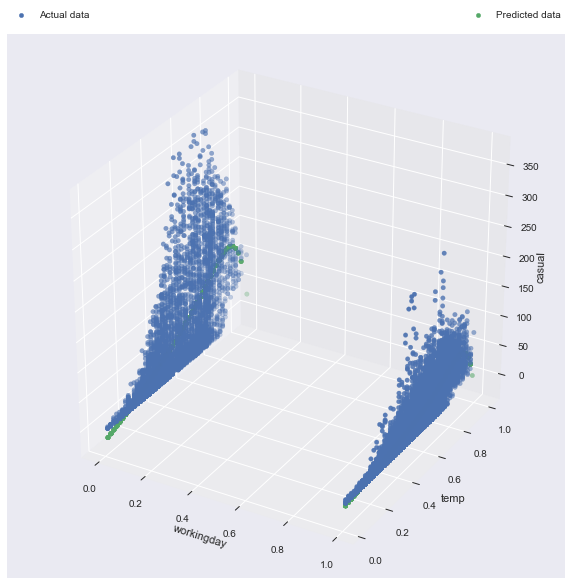

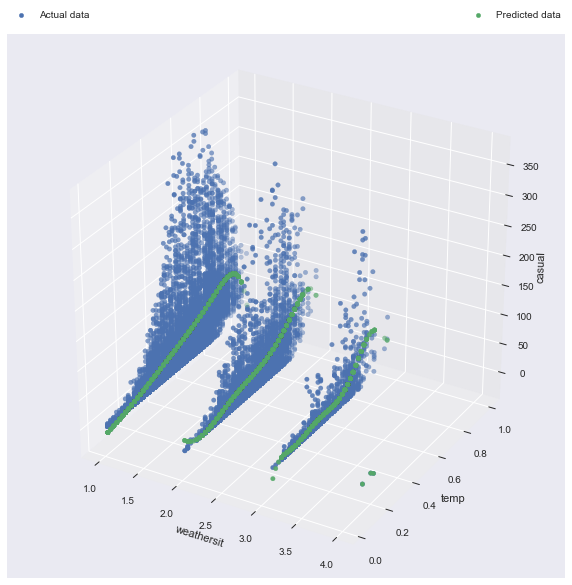

In [34]:
ivars = ['yr', 'workingday', 'weathersit', 'temp']
axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = hour[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = make_pipeline(PolynomialFeatures(15), Ridge())
    model.fit(np.array(y), hour['casual'])
    plot3d.scatter(hour[x[0]],hour[x[1]],hour['casual'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('casual')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(hour[x[0]],hour[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(hour['casual'], model_pred)) 

<span style="color:blue">
**Conclusion for Section 5**

<span style="color:blue">
As expected, the first few models were quite inaccurate. However, the high-degree polynomials were accurate. I don't see any reason why this would be the case for the casual data but not the cnt.

## Regressing registered onto the conditions observed in the days dataframe

In [35]:
day_conditions = ['const','season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

registered_day_model = sm.OLS(day['registered'], sm.add_constant(day[day_conditions[1:]])).fit()

print(registered_day_model.summary())
updated_day_conditions = day_conditions

def p_threshold():
    for x in registered_day_model.pvalues:
        if x >= (10**-10): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(registered_day_model.rsquared))
    max_p = max(registered_day_model.pvalues)
    del updated_day_conditions[np.where(registered_day_model.pvalues == max_p)[0][0]]
    registered_day_model = sm.OLS(day['registered'], sm.add_constant(day[updated_day_conditions[1:]])).fit()
    
print('\n\n', registered_day_model.pvalues)
print('\n\n', updated_day_conditions)

print(registered_day_model.rsquared)
features = updated_day_conditions

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     290.4
Date:                Sat, 24 Nov 2018   Prob (F-statistic):          7.46e-256
Time:                        21:19:00   Log-Likelihood:                -5792.2
No. Observations:                 731   AIC:                         1.161e+04
Df Residuals:                     719   BIC:                         1.166e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        768.2098    185.551      4.140      0.0

<span style="color:blue">
So, we can see that 'yr', 'workingday', 'weathersit', and 'atemp' are the most important features here. $R^2$ is relatively high here, compared to some of the other models above.

[1855.00678669 1023.23053417]
MSE: 1346279.81
[1817.84261037 -664.26219222]
MSE: 1442064.01
[1778.63089324 4958.52890803]
MSE: 921922.14
[1076.69224528 -801.85763127]
MSE: 2016606.67
[ 926.50246252 5072.28793302]
MSE: 1526085.41
[-564.48489662 4980.82732125]
MSE: 1618039.14


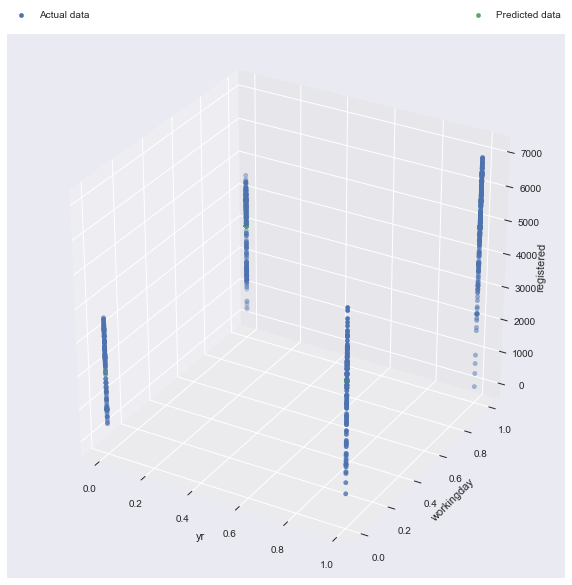

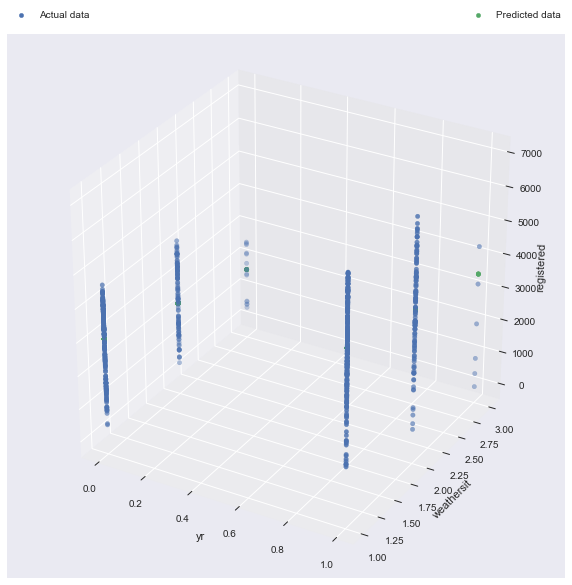

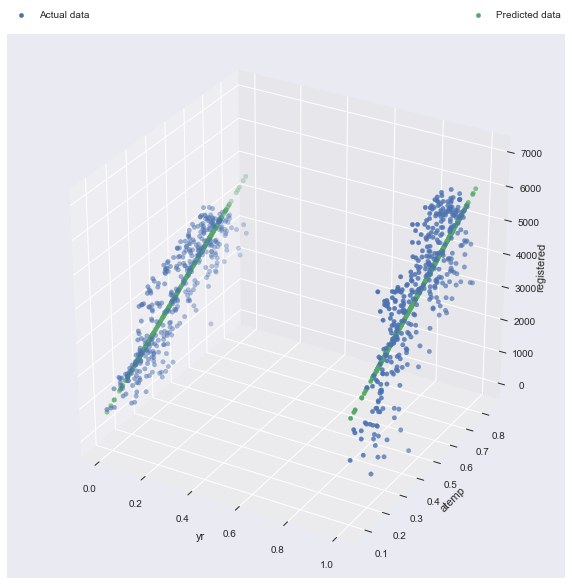

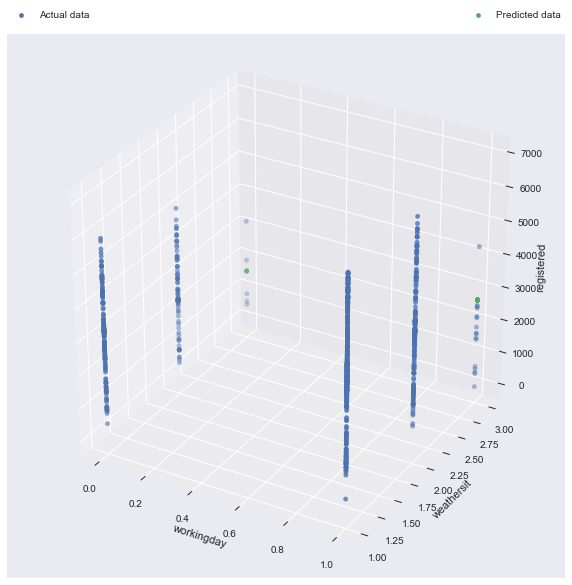

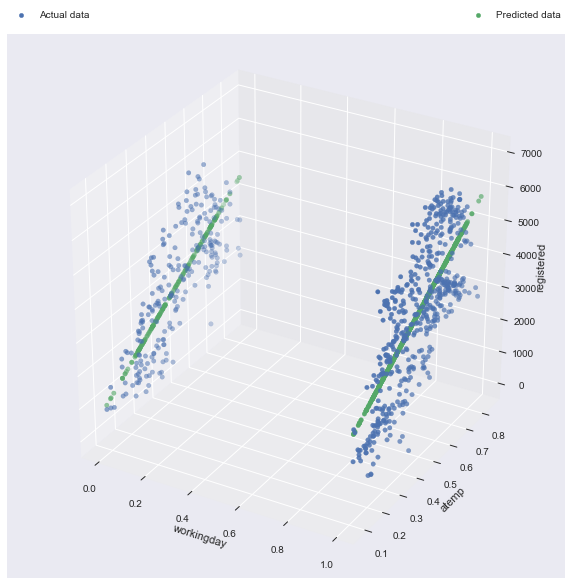

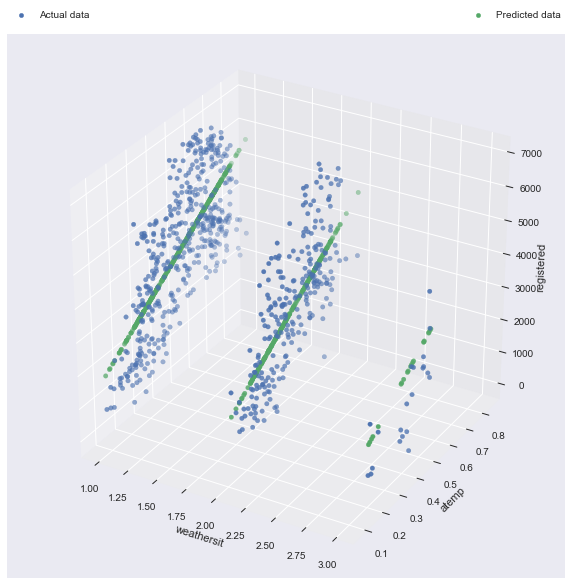

In [36]:
ivars = ['yr', 'workingday', 'weathersit', 'atemp']
axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = LinearRegression().fit(np.array(y),day['registered'])
    print(model.coef_)
    plot3d.scatter(day[x[0]],day[x[1]],day['registered'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('registered')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['registered'], model_pred)) 
    

Model's MSE: 645317.7356849149
day['registered']'s variance: 2434399.9620298683



Mean absolute error on training:  672.1294658126633             
Mean absolute error on testing:  626.6379672562783 


Mean absolute error on training:  660.0399014289613             
Mean absolute error on testing:  580.4236824816945 


Mean absolute error on training:  611.4396994623787             
Mean absolute error on testing:  814.9533271779329 


Mean absolute error on training:  653.0948114079154             
Mean absolute error on testing:  594.4238285792021 


Mean absolute error on training:  544.8180694681565             
Mean absolute error on testing:  1133.2011808278537 


Average mean absolute error for training:  628.304389516015
Average mean absolute error for testing:  749.9279972645924
Standard Deviation for registered: 1560.2563770194527


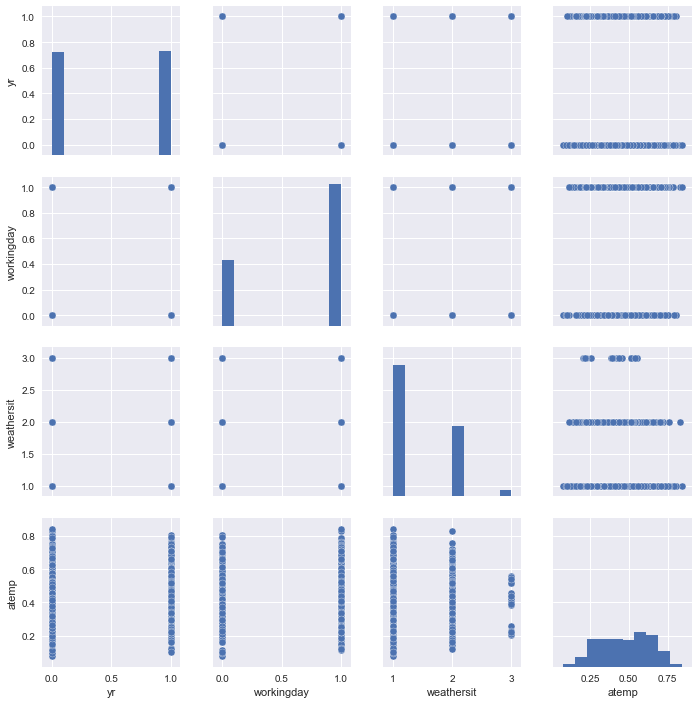

In [37]:
registered_day_model = LinearRegression().fit(np.array(day[ivars]),day['registered'])
print("Model's MSE: " + str(mean_squared_error(day['registered'],np.array(registered_day_model.predict(day[ivars])))))
print("day['registered']'s variance: " + str(day['registered'].std()**2) + '\n\n\n')
sns.pairplot(day[ivars])

mae_testing = []
mae_training = []

X = np.array(day[['yr','workingday','weathersit','atemp']])
y = np.array(day['registered'])
kf = KFold(n_splits=5)
kf.get_n_splits(X)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    model = LinearRegression().fit(np.array(X_train),y_train)
    model_pred = model.predict(np.array(X_train))
    print("Mean absolute error on training: ", str(mean_absolute_error(model_pred, y_train)), '            ')
    mae_training.append(mean_absolute_error(model_pred, y_train))
    model_pred = model.predict(np.array(X_test))
    print("Mean absolute error on testing: ", str(mean_absolute_error(model_pred, y_test)), '\n\n')
    mae_testing.append(mean_absolute_error(model_pred, y_test))


print("Average mean absolute error for training: ", str(sum(mae_training)/len(mae_training)))
print("Average mean absolute error for testing: ", str(sum(mae_testing)/len(mae_testing)))
print("Standard Deviation for registered: " + str(day['registered'].std()))

In [38]:
#Linear Regression
registered_day_model = LinearRegression().fit(np.array(day[ivars]),day['registered'])
predictions = registered_day_model.predict(np.array(day[ivars]))
print("Linear: " + str(mean_squared_error(predictions,day['registered'])))

#LARS Lasso Ridge regression
registered_day_model = linear_model.Lars()
registered_day_model.fit(np.array(day[ivars]), day['registered'])
predictions = registered_day_model.predict(np.array(day[ivars]))
print("LARS: " + str(mean_squared_error(predictions,day['registered'])))

#regular ridge regression from Sci-kit Learn
registered_day_model = linear_model.Ridge(alpha = .5)
registered_day_model.fit(np.array(day[ivars]), day['registered'])
predictions = registered_day_model.predict(np.array(day[ivars]))
print("Ridge: " + str(mean_squared_error(predictions, day['registered'])))

#polynomial regression
for count, degree in enumerate([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(day[ivars], day['registered'])
    predictions = model.predict(day[ivars])
    print("Polynomial of degree %d :  " % degree + str(mean_squared_error(predictions, day['registered'])))
    
print("Variance of day['registered']: " + str(day['registered'].std()**2))

Linear: 645317.7356849149
LARS: 645317.7356849149
Ridge: 645676.3840212431
Polynomial of degree 1 :  646683.0231907793
Polynomial of degree 2 :  566677.692666982
Polynomial of degree 3 :  512321.54214909545
Polynomial of degree 4 :  484696.60286560893
Polynomial of degree 5 :  469485.6946691423
Polynomial of degree 6 :  456198.6415980969
Polynomial of degree 7 :  448255.02281383384
Polynomial of degree 8 :  442960.81204371667
Polynomial of degree 9 :  439056.41284089326
Polynomial of degree 10 :  435708.57432195207
Polynomial of degree 11 :  433034.73796048446
Polynomial of degree 12 :  429652.9252779575
Polynomial of degree 13 :  427403.8182069797
Polynomial of degree 14 :  426196.1286473095


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.398872e-17
  overwrite_a=False)


Polynomial of degree 15 :  425841.74702162127


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 16 :  546217.8847527525


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 17 :  955252.5262735862


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 18 :  985743.8412987054


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 19 :  1619826.2391362933


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 20 :  1539688.7937004569


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 21 :  1686366.7944290517


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 22 :  1692455.5362442282


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 23 :  1714225.6215349138


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 24 :  1691553.1243381572


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "


Polynomial of degree 25 :  1736258.536239078
Variance of day['registered']: 2434399.9620298683


<span style="color:blue">
Just like with day['casual'], the best model tested above for the above data is the $15$th degree polynomial.

MSE: 1325019.86
MSE: 1408238.21
MSE: 801691.23
MSE: 1978177.35
MSE: 1410717.99

C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.420327e-17
  overwrite_a=True).T
C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.756613e-17
  overwrite_a=True).T
C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.849065e-17
  overwrite_a=True).T



MSE: 1399250.77


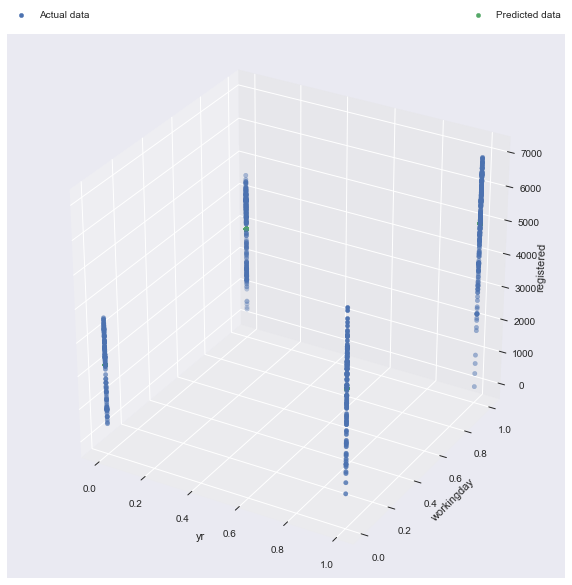

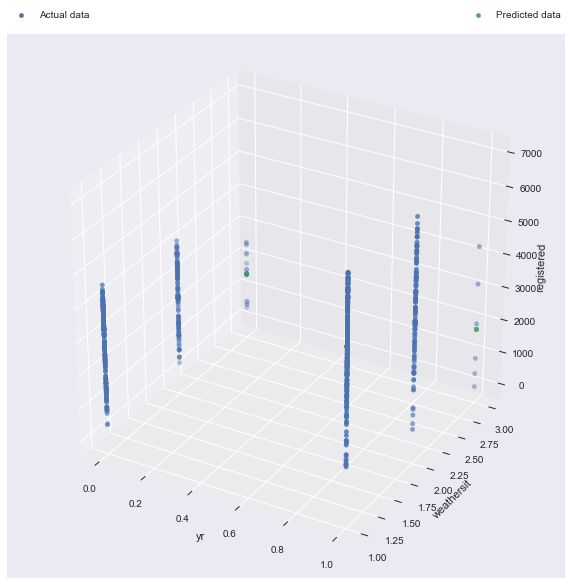

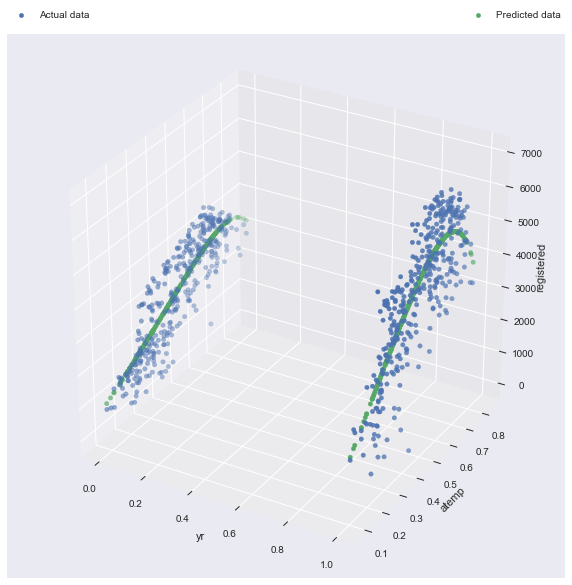

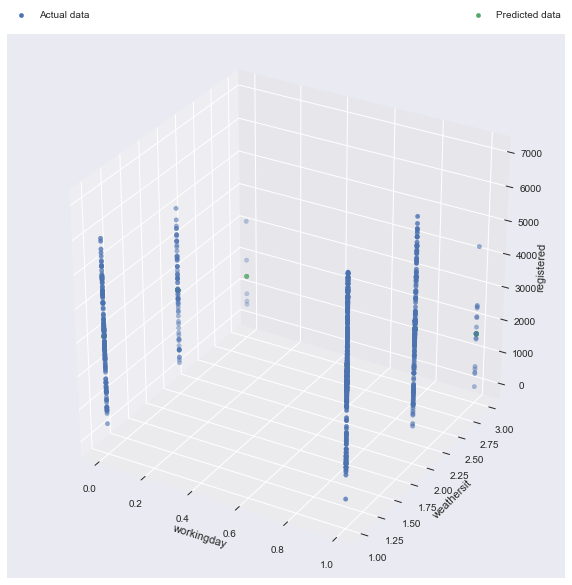

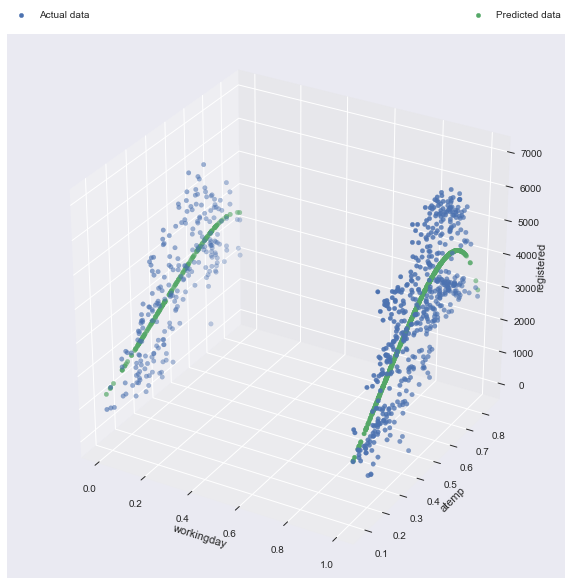

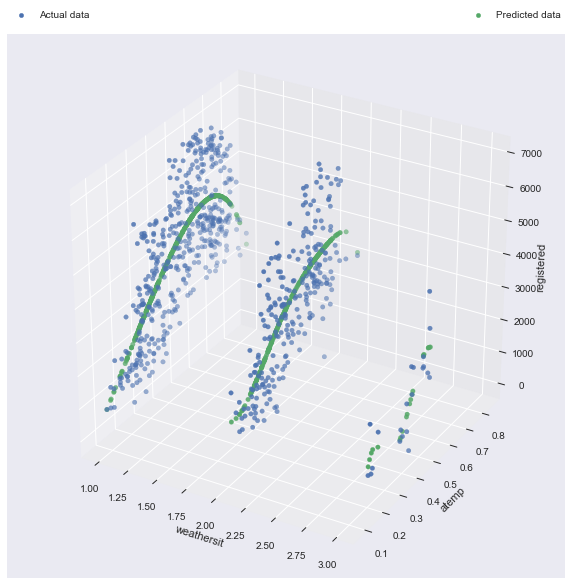

In [39]:
ivars = ['yr', 'workingday', 'weathersit', 'atemp']
axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = day[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = make_pipeline(PolynomialFeatures(15), Ridge())
    model.fit(y, day['registered'])
    plot3d.scatter(day[x[0]],day[x[1]],day['registered'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('registered')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(day[x[0]],day[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(day['registered'], model_pred)) 
    

<span style="color:blue">
**Conclusions for Section 6**
- There does exist a correlation between the features and registered.
- The features that most effectively predict cnt are 'yr', 'workingday', 'weathersit', 'atemp' (determined through $R^2$ and $p$ values)
- The linear model is generalizeable and not over-fit (determined through MSE)
- The 15-th degree polynomial model was the most accurate in terms of modelling the data (best out of the linear regressions, ridge regressions, and the $1$st, $2$nd, $3$rd,..., $25$th degree polynomials). (determined through MSE)

<span style="color:blue">
The $R^2$ value of the registered model was much higher than that of the casual model, and the variables relating to weather and outdoor conditions had less influence on the number of registered riders. Probably, this is because people who pay to use the bikes in advance would be less swayed by outdoor conditions when deciding to use a bike, while people who haven't already payed or invested effort to register would be more swayed by conditions. Workingday plays a big role in the model, which indicates that a lot of registered riders use bikes to get to work, but fewer registered riders use bikes for recreation etc.
    

## Regressing registered onto the conditions observed in the hours dataframe

In [40]:
hour_conditions = ['const', 'hr','season','yr','mnth','holiday','weekday','workingday','weathersit','temp','atemp','hum','windspeed']

registered_hour_model = sm.OLS(hour['registered'], sm.add_constant(hour[hour_conditions[1:]])).fit()

print(registered_hour_model.summary())
updated_hour_conditions = hour_conditions

def p_threshold():
    for x in registered_hour_model.pvalues:
        if x >= (10**-10): 
            return True
    return False

while(p_threshold()):
    print('R^2 coeff: ' + str(registered_hour_model.rsquared))
    max_p = max(registered_hour_model.pvalues)
    del updated_hour_conditions[np.where(registered_hour_model.pvalues == max_p)[0][0]]
    registered_hour_model = sm.OLS(hour['registered'], sm.add_constant(hour[updated_hour_conditions[1:]])).fit()
    
print('\n\n', registered_hour_model.pvalues)
print('\n\n', updated_hour_conditions)

print(registered_hour_model.rsquared)
features = updated_hour_conditions

                            OLS Regression Results                            
Dep. Variable:             registered   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.335
Method:                 Least Squares   F-statistic:                     730.6
Date:                Sat, 24 Nov 2018   Prob (F-statistic):               0.00
Time:                        21:19:27   Log-Likelihood:            -1.0834e+05
No. Observations:               17379   AIC:                         2.167e+05
Df Residuals:                   17366   BIC:                         2.168e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -44.7291      6.140     -7.284      0.0

In [41]:
#Linear Regression
casual_hour_model = LinearRegression().fit(np.array(hour[features[1:]]),hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("Linear: " + str(mean_squared_error(predictions,hour['casual'])))

#LARS Lasso Ridge regression
casual_hour_model = linear_model.Lars()
casual_hour_model.fit(np.array(hour[features[1:]]), hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("LARS: " + str(mean_squared_error(predictions,hour['casual'])))

#regular ridge regression from Sci-kit Learn
casual_hour_model = linear_model.Ridge(alpha = .5)
casual_hour_model.fit(np.array(hour[features[1:]]), hour['casual'])
predictions = casual_hour_model.predict(np.array(hour[features[1:]]))
print("Ridge: " + str(mean_squared_error(predictions, hour['casual'])))

#polynomial regression
for count, degree in enumerate([1, 2, 3, 4, 5,6]):
    model = make_pipeline(PolynomialFeatures(degree), Ridge())
    model.fit(hour[features[1:]], hour['casual'])
    predictions = model.predict(hour[features[1:]])
    print("Polynomial of degree %d :  " % degree + str(mean_squared_error(predictions, hour['casual'])))
    
print("Variance of hour['casual']: " + str(hour['casual'].std()**2))

Linear: 1334.3496240347633
LARS: 1334.3496240347636
Ridge: 1334.3501824837172
Polynomial of degree 1 :  1334.3518533029323
Polynomial of degree 2 :  904.1759945602165
Polynomial of degree 3 :  639.5218512594172
Polynomial of degree 4 :  466.8533379341546


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.263008e-18
  overwrite_a=True).T


Polynomial of degree 5 :  388.0921116364593


C:\Users\prana\AppData\Roaming\Python\Python36\site-packages\sklearn\linear_model\ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.129155e-21
  overwrite_a=True).T


Polynomial of degree 6 :  337.17426679198326
Variance of hour['casual']: 2430.986021468238


<span style="color:blue">
    Just like in the casual data, the high-degree polynomials seem accurate.

MSE: 2156.83
MSE: 2324.47
MSE: 1839.73
MSE: 2154.73
MSE: 1533.53
MSE: 1863.95


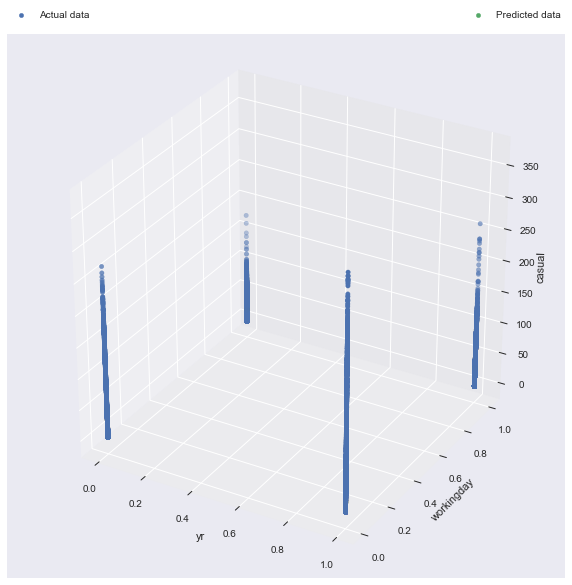

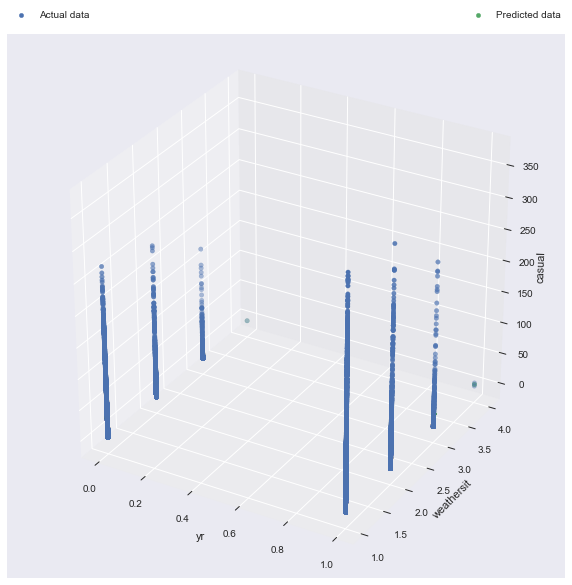

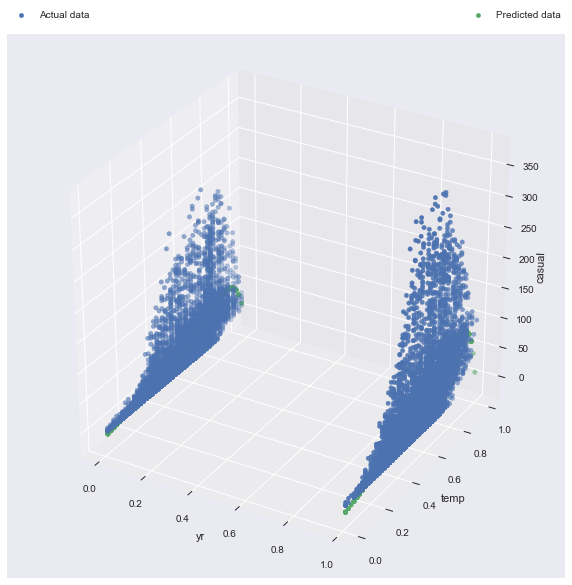

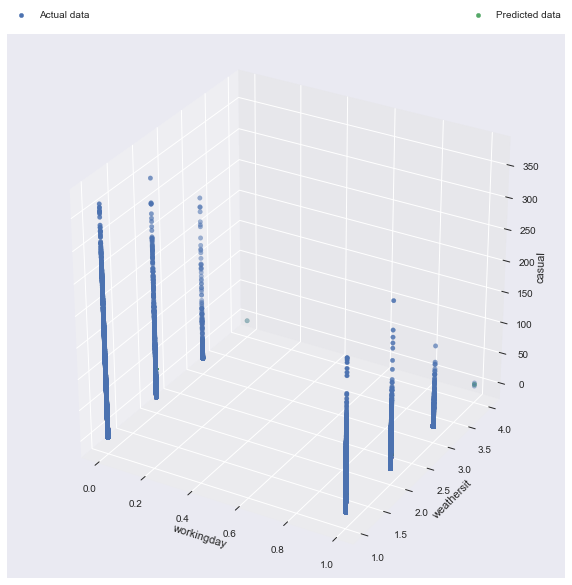

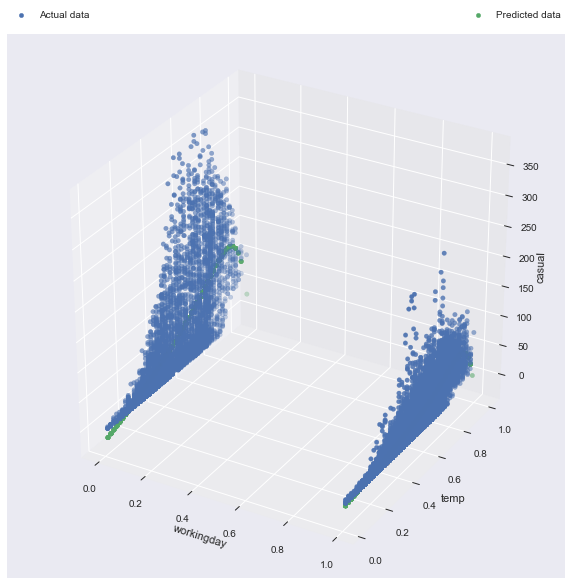

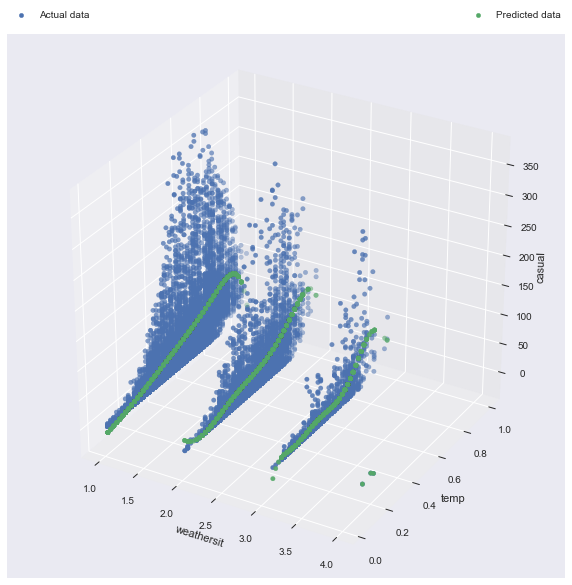

In [42]:
ivars = ['yr', 'workingday', 'weathersit', 'temp']
axes = []
for x in range(0,len(ivars)):
    for y in range(x+1,len(ivars)):
        axes.append([ivars[x],ivars[y]])

for x in axes:
    y = hour[[x[0],x[1]]]
    fig = plt.pyplot.figure(figsize=(10,10))
    plot3d = fig.add_subplot(111, projection = '3d')
    model = make_pipeline(PolynomialFeatures(15), Ridge())
    model.fit(np.array(y), hour['casual'])
    plot3d.scatter(hour[x[0]],hour[x[1]],hour['casual'],label='Actual data')
    plot3d.set_xlabel(str(x[0]))
    plot3d.set_ylabel(str(x[1]))
    plot3d.set_zlabel('casual')
    model_pred = model.predict(np.array(y))
    plot3d.scatter(hour[x[0]],hour[x[1]],model_pred,label='Predicted data')
    plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
    print("MSE: %.2f" % mean_squared_error(hour['casual'], model_pred)) 

<span style="color:blue">
    **Conclusions for Section 7**

<span style="color:blue">
Only the high degree polynomial models seemed to model the data well. This is similar to in the casual data, but different from cnt.

## Testing some other questions

<span style="color:blue">
    **What are the interactions between the season and temp features?**

Mean squared error: 2109405.27


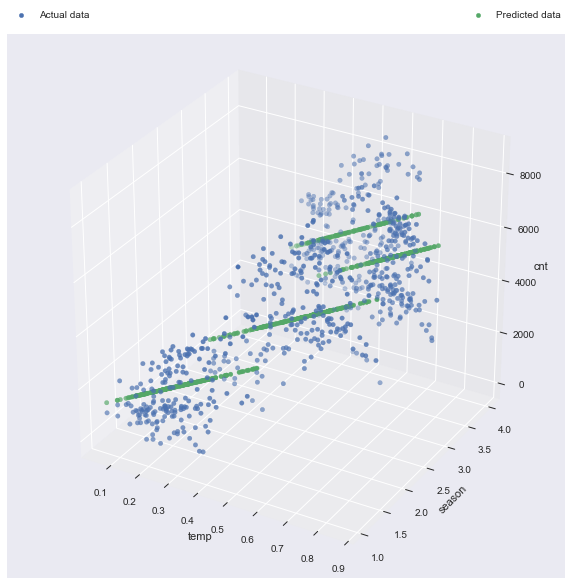

In [43]:
season_temp = day[['temp','season']]
fig = plt.pyplot.figure(figsize=(10,10))
plot3d = fig.add_subplot(111, projection='3d')
season_temp_cnt_model = LinearRegression().fit(season_temp, day['cnt'])
plot3d.scatter(day['temp'],day['season'],day['cnt'],label='Actual data')
plot3d.set_xlabel('temp')
plot3d.set_ylabel('season')
plot3d.set_zlabel('cnt')
season_temp_cnt_pred = season_temp_cnt_model.predict(np.array(season_temp))
plot3d.scatter(day['temp'],day['season'],season_temp_cnt_pred,label='Predicted data')
plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
print("Mean squared error: %.2f" % mean_squared_error(day['cnt'], season_temp_cnt_pred)) 

Mean squared error: 1986208.51


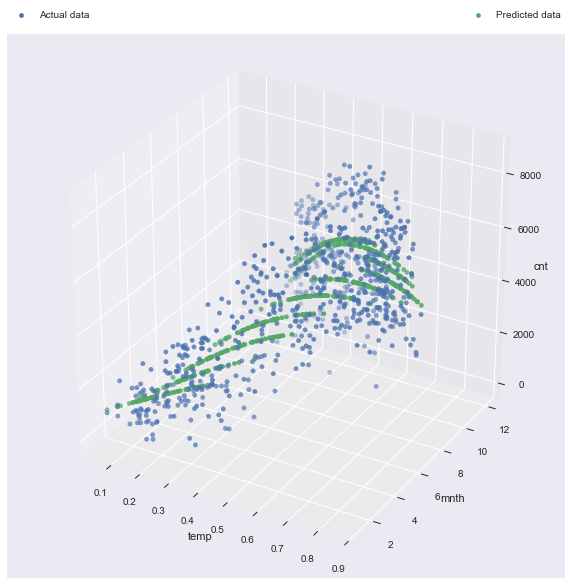

In [51]:
mnth_temp = day[['mnth','temp']]
fig = plt.pyplot.figure(figsize=(10,10))
plot3d = fig.add_subplot(111, projection='3d')
mnth_temp_cnt_model = make_pipeline(PolynomialFeatures(3), Ridge())#LinearRegression().fit(mnth_temp, day['cnt'])
mnth_temp_cnt_model.fit(np.array(mnth_temp), day['cnt'])
plot3d.scatter(day['temp'],day['mnth'],day['cnt'],label='Actual data')
plot3d.set_xlabel('temp')
plot3d.set_ylabel('mnth')
plot3d.set_zlabel('cnt')
mnth_temp_cnt_pred = mnth_temp_cnt_model.predict(np.array(mnth_temp))
plot3d.scatter(day['temp'],day['mnth'],mnth_temp_cnt_pred,label='Predicted data')
plt.pyplot.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,ncol=2, mode="expand", borderaxespad=0.)
print("Mean squared error: %.2f" % mean_squared_error(day['cnt'], mnth_temp_cnt_pred)) 

In [45]:
print(mnth_temp_cnt_model.coef_)
print(season_temp_cnt_model.coef_)

[  83.63325303 6293.41818619]
[5858.72661099  385.45643734]


<span style="color:blue">
*As can be seen above, increasing temperature increases cnt during winter and decreases it during the summer. This is to be expected, since it would seem like higher temperatures would encourage riders during the winter but discourage them during the summer. The fact that cnt is highest at the middle of the year supports this, since the middle of the year has more favorable weather than the beginning and end.*

<span style="color:blue">
**Have the bike sharing programs been getting more or less popular?**

In [46]:
model = LinearRegression().fit(np.array(day['yr']).reshape(-1,1),np.array(day['cnt']))
print(model.coef_)

[2194.17278239]


<span style="color:blue">
    Since the coefficient of yr in the model is positive, this indicates that the sharing programs have been getting more popular.

<span style="color:blue">
    **In which conditions can the companies expect the most users?**

In [47]:
max_cnt = max(day['cnt'])
loc = np.where(day['cnt'] == max_cnt)
display(day.loc[loc[0][0]])
print(np.mean(day['cnt']))

instant              624
dteday        2012-09-15
season                 3
yr                     1
mnth                   9
holiday                0
weekday                6
workingday             0
weathersit             1
temp            0.608333
atemp           0.585867
hum             0.501667
windspeed       0.247521
casual              3160
registered          5554
cnt                 8714
Name: 623, dtype: object

4504.3488372093025


## Reflection

This project really improved my knowledge of different statistical measures and their significance, such as p-values, F-statistics, and variance. It also taught me a lot about sklearn, statsmodels.api, matplotlib, and seaborn syntax, as well as some theory regarding the machine learning models. For example, two big concepts I learned about was feature selection and cross validation. I think that it also gave me practice in problem-solving and reading online documentation, as oppose to in DataCamp where all the necessary information for exercises is already provided. I think it was very helpful practice overall.

**Please see the end of each section for conclusions.**